# Setup


In [ ]:
quiet_library <- function(...) {
    suppressPackageStartupMessages(library(...))
}
quiet_library(Seurat)
quiet_library(tidyverse)
quiet_library(ggplot2)
quiet_library(Matrix)
quiet_library(H5weaver)
quiet_library(dplyr)
quiet_library(viridis)
quiet_library(harmony)
quiet_library(Nebulosa)
quiet_library(future)
quiet_library(future.apply)
quiet_library(dittoSeq)
quiet_library("ArchR")
quiet_library("rstatix")
quiet_library("ggpubr")


In [ ]:
# Check number of cores
future::availableCores()
# Set up parallel processing to run when using 'future' functions
future::plan(strategy = "multicore", workers = future::availableCores() - 3)
options(future.globals.maxSize = 1000 * 1024^5)
# to turn off parallel processing run line below
# future::plan(strategy = "sequential")


system 
    16

In [ ]:
# define working path
data_path <- "/home/jupyter/data/preRA_teaseq/EXP-00243"
meta_path <- "/home/jupyter/data/preRA_teaseq/meta_data"
output_path <- "/home/jupyter/data/preRA_teaseq/output_results/integrated_analysis"
ref_path <- "/home/jupyter/data/Reference/Nichenet"
fig_path <- "/home/jupyter/figures/preRA_teaseq/integrated_analysis"
if (!dir.exists(fig_path)) (dir.create(fig_path, recursive = TRUE))
if (!dir.exists(output_path)) (dir.create(output_path, recursive = TRUE))
# define a project name
proj_name <- "PreRA_teaseq_integrated_analysis"


In [ ]:
# define the color palette to be used
npg_color <- c(
    "#E64B35FF", "#4DBBD5FF", "#00A087FF", "#3C5488FF", "#F39B7FFF",
    "#8491B4FF", "#91D1C2FF", "#DC0000FF", "#7E6148FF", "#B09C85FF"
)
nejm_color <- c("#BC3C29FF", "#0072B5FF", "#E18727FF", "#20854EFF", "#7876B1FF", "#6F99ADFF", "#FFDC91FF", "#EE4C97FF")
jama_color <- c("#374E55FF", "#DF8F44FF", "#00A1D5FF", "#B24745FF", "#79AF97FF", "#6A6599FF", "#80796BFF")
jco_color <- c("#0073C2FF", "#EFC000FF", "#868686FF", "#CD534CFF", "#7AA6DCFF", "#003C67FF", "#8F7700FF")
cluster_colors <- c(
    "#DC050C", "#FB8072", "#1965B0", "#7BAFDE", "#882E72", "#B17BA6", "#FF7F00", "#FDB462", "#E7298A",
    "#E78AC3", "#33A02C", "#B2DF8A", "#55A1B1", "#8DD3C7", "#A6761D", "#E6AB02", "#7570B3", "#BEAED4", "#666666", "#999999",
    "#aa8282", "#d4b7b7", "#8600bf", "#ba5ce3", "#808000", "#aeae5c", "#1e90ff", "#00bfff", "#56ff0d", "#ffff00"
)
cluster_colors_ext <- colorRampPalette(cluster_colors)(36)
options(repr.plot.width = 20, repr.plot.height = 15)


In [1]:
# source("/home/jupyter/github/Teaseq-analysis/scRNA_teaseq_ananlysis_helper_functions.r")

In [2]:
### do pseudoBulk DEG analysis from seurat object around the functions from scran packages ###
# Identify genes expressing in a minimum percentage of cells in at least one feature group
filter_genes_pct_groups <- function(counts, meta, min_expr_var, min_expr){
    # get barcode list for each level of each variable
    barcode_list <- lapply(min_expr_var, function(vname){
        split(meta$barcodes, meta[[vname]]) %>%
        lapply(.,function(x){intersect(x, colnames(counts))})
    })
    barcode_list <- Reduce(c, barcode_list)      
    barcode_list <- barcode_list[sapply(barcode_list, length) > 0]
    selGenes_list <- lapply(barcode_list, function(bcs){
        temp <- counts[, as.character(bcs)]
        if(length(bcs)>1){
            selGenes <- data.frame(num_cells_expressed = rowSums(temp > 0)) %>%
                                  rownames_to_column(var = "Gene") %>%
                                  filter(num_cells_expressed >= min_expr*length(bcs))
        } else {
            selGenes <- data.frame(num_cells_expressed = temp > 0) %>%
                                   mutate(Gene = names(temp)) %>%
                                  filter(num_cells_expressed >= min_expr*length(bcs))
        }
    })
    selGenes <- do.call(bind_rows, selGenes_list) %>%
        select(-num_cells_expressed) %>%
        distinct()
    return(selGenes)
}


#' FilterGenes
#' @param min_expr_var Character value or vector. Names of metadata columns in
#' \code{meta} for which to apply the minimum expression criteria
#' @param min_expr Numeric value between 0 and 1, default 0.1. Fraction of cells 
#' that must be expressed in at least one \code{min_expr_var} level for a gene 
#' to be kept
#' @param min_expr_var variable in mata.data of seurat to which group of the monial  

# filter out genes that are expression below 10% of the cells within each group
FilterGenes <- function(so, assay='RNA', min_expr_var, min_expr=0.1){
    normcounts <- so[[assay]]@data
    meta <- so@meta.data
    selGenes <- filter_genes_pct_groups(meta=meta, counts=normcounts, 
                                        min_expr_var=min_expr_var, min_expr=min_expr)
    return(selGenes$Gene)
}


#' MakeSoPseudoBulk
#'
#' Create a wrapper function to prepare pseudoBulk for DEG analysis from seurat object using the functions from scran packages
#' agrregrate gene counts by cell type and subject
#'
#' @param so seurat object
#' @param meta.cols olumn names in so mata.data to keep in the SummarizedExperiment object, subject_id should be included. 
#' the pseudoBulk will be created by the unique combination in meta.cols
#' @param celltype.col column name in meta.cols to specifify the cell type or cluster
#' @param min_expr_var Character value or vector. Names of metadata columns in
#' \code{meta} for which to apply the minimum expression criteria
#' @param min_expr Numeric value between 0 and 1, default 0.1. Fraction of cells 
#' that must be expressed in at least one \code{min_expr_var} level for a gene 
#' to be kept
#' @param verbose logival value, default FALSE. If true will print a `message()` in the case of

#' @return pseudo a SummarizedExperiment object which nomarlized counts are aggregrate

#' @examples 
#' make pseudobulk for cd8 and cd8 naive by subject and cell type
#' cd4_cd8na_pseudo <- MakeSoPseudoBulk(
#'    cd4_cd8na, assay='RNA', meta.cols=c('pure_celltype', 'subject_id', 'pediatric_senior', 'CMV', 'batch_id'),
#'    celltype.col='pure_celltype',  min_expr_var='pure_celltype', min_expr=0.1, ncores=NULL, verbose = TRUE)

MakeSoPseudoBulk <- function(so, assay='RNA', meta.cols, celltype.col, min_expr_var=NULL, min_expr=0.1, ncores=NULL, verbose = FALSE){
    require('scran')
    DefaultAssay(so) <- assay
    # setup parallelization parameters
    if(is.null(ncores)){
        ncores <- parallel::detectCores() - 3
    } else (ncores <- ncores)
    param <- BiocParallel::MulticoreParam(workers = ncores, progressbar = TRUE)
    if(verbose){
       message("Converting seurat object to sce object")  
    }
    # convert the seurat object to a sce object
    sce <- as.SingleCellExperiment(so, assay = assay)
    
    if(verbose){
       message("Computing normalize factor by computeSumFactors")  
    }
    # normalized cell-specific biases
    sce <- computeSumFactors(sce, clusters=colData(sce)[, celltype.col], BPPARAM=param)
    
    #Compute log-normalized expression values
    sce <- logNormCounts(sce)
    
    # filter gene fy minimal expression per cell type
    if(!is.null(min_expr_var)){
        # filter gene fy minimal expression per cell type
        selGenes <- FilterGenes(so, assay=assay, min_expr_var=min_expr_var, min_expr=min_expr)
        # filter genes of minimal expression requirement 
        sce <- sce[selGenes, ]
    }
    # extract the metadta from the seurat object
    meta <-  DataFrame(so@meta.data[, meta.cols])
    # make pseudobulk summarized counts matrix across subject and cell type    
    if(verbose){
       message("Make pseudobulk summarized counts matrix across subject and cell type")  
    }
    pseudo <- aggregateAcrossCells(sce, meta, BPPARAM=param)
    return(pseudo)
}


# pathwayDF %>% distinct(celltype) %>% mutate(colors=cluster_colors[1:10]) %>% 
#     mutate(ct_colors=paste0("'", celltype, "' = '", colors, "'")) %>% select(ct_colors)
PseudobulkHeatmap <- function(cell.type, pseudo, deg_list, figname=NULL, scale=TRUE, plot=TRUE, width=12, height=8){
    suppressPackageStartupMessages(library(ComplexHeatmap))
        # subset the deg list 
    deg_fl <- deg_list %>% dplyr::filter(cell_type==cell.type)
    # subset the pseudobulk 
    pseudo_subset <- subset(pseudo, rownames(rowData(pseudo)) %in% deg_fl$gene,
                            clean_l2_cell_types==cell.type)

    # set up the column annotation
    col_data <- colData(pseudo_subset) %>% as_tibble() %>% distinct(subject_id, age, cohort) %>% arrange(subject_id)
    color_fun = circlize::colorRamp2(c(0, 100), c("white", "#20854EFF"))
    col_anno <- HeatmapAnnotation(cohort=col_data$cohort, age=col_data$age,
                                  col = list(cohort=c('Healthy' = "#BC3C29FF", 'pre-RA' = "#0072B5FF"),
                                            age=color_fun))
    # # set up the data matrix
    logcounts <- assay(pseudo_subset, 'logcounts') 
    colnames(logcounts) <- colData(pseudo_subset)$subject_id
    #return(deg_fl)
    logcounts <- logcounts %>% as.data.frame() #%>% filter(rownames(logcounts) %in% deg_fl$gene)
    # all(rownames(col_anno)==colnames(logcounts))
    # # set up the row annotation
    # row_anno <- rowAnnotation(Celltype=pseudo$celltype, 
    #                           col = list(Celltype=l2_ct_levs_color))
    if(scale){
        logcounts <- t(scale(t(logcounts)))
    }
    col_fun2 = circlize::colorRamp2(c(-2, 0, 2), c("blue", "white", "red"))
    p1 <- ComplexHeatmap::Heatmap(logcounts, 
                                  col = col_fun2,
                                  top_annotation=col_anno,
                                      column_title=cell.type,
                                  # left_annotation = row_anno, 
                                 # cluster_rows = FALSE, 
                                  row_names_gp = gpar(fontsize = 8),
                                  heatmap_legend_param = list(
        title = "avg.expression"
    ))
    if(plot){
        pdf(file.path(fig_path, paste(proj_name, 'pseudobulk',
                                       figname,cell.type,'Heatmap.pdf', sep='_')), 
               width=width, height=height)
        draw(p1)
        dev.off()         
    }
  
    p1    
}


CalClusterFreq <- function(seurat_data, cluster.name, group.by='subject_id', 
                              color.by){
    # plot the frequency by sample for l1 adt clustering
    cluster_counts <- seurat_data@meta.data %>% as_tibble() %>% 
        group_by(.data[[group.by]], .data[[cluster.name]], .data[[color.by]]) %>% 
        summarise(counts=n(), !!group.by:=.data[[group.by]], !!color.by:=.data[[color.by]],
                  .groups = 'drop') %>% 
        distinct()%>% group_by(.data[[group.by]]) %>% 
        mutate(frequency=counts/sum(counts), total_counts=sum(counts))
    return(cluster_counts)
}


# Load data


In [ ]:
# load the annotated subset dataset into one seurat object
ra_tea_all <- readRDS(file.path(data_path, "PreRA_teaseq_seurat_qc_filtered_cells_lsi.rds"))


The default behaviour of split.by has changed.
Separate violin plots are now plotted side-by-side.
To restore the old behaviour of a single split violin,
set split.plot = TRUE.
      
This message will be shown once per session.



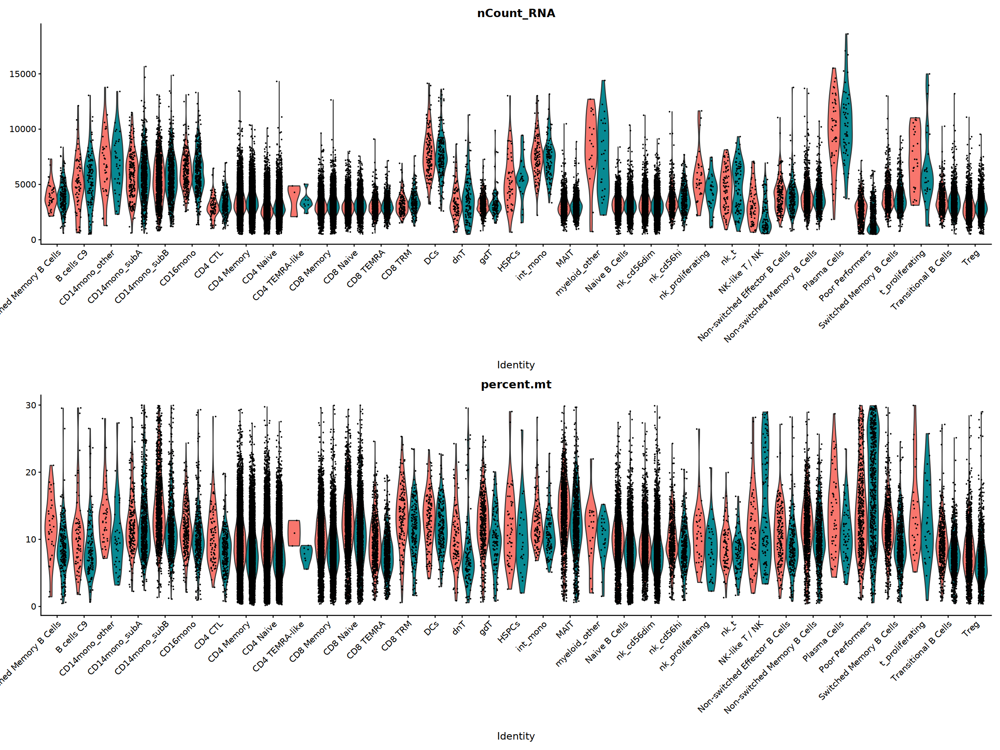

In [ ]:
VlnPlot(ra_tea_all,
        features = c("nCount_RNA", "percent.mt"), pt.size = 0.02,
        ncol = 1,
        group.by = "l2_cell_types", split.by = "cohort"
)
ggsave(file.path(fig_path, paste0(proj_name, "_l2_cell_types_cohort_qc_plots.pdf")), width = 18, height = 12)


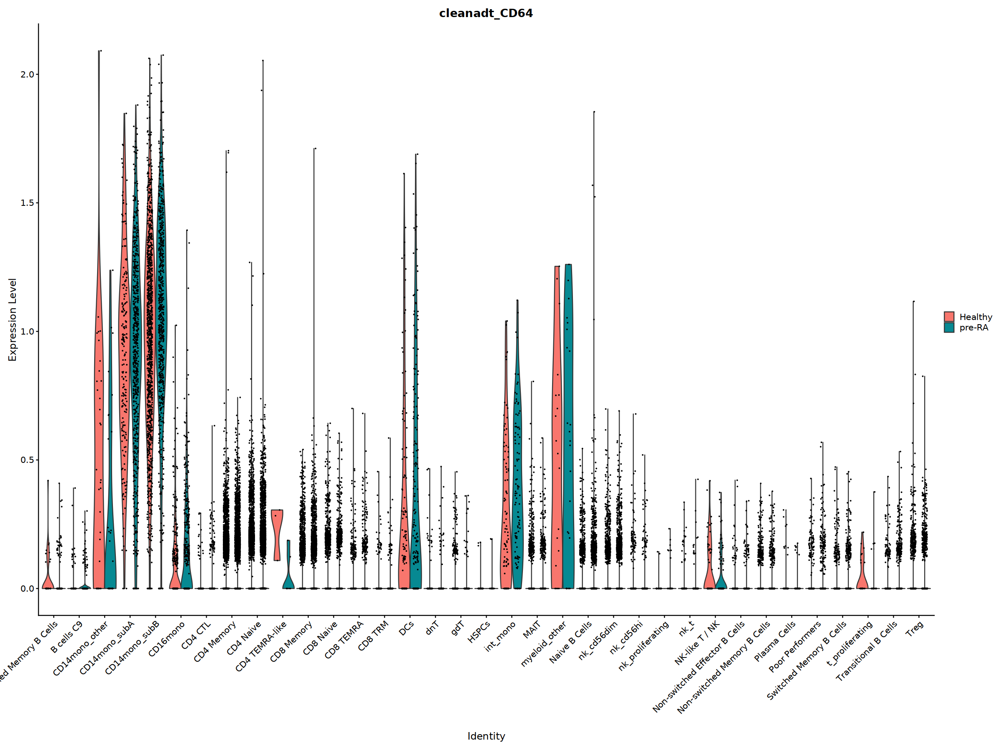

In [ ]:
VlnPlot(ra_tea_all,
        features = c("cleanadt_CD64"), pt.size = 0.02,
        ncol = 1,
        group.by = "l2_cell_types", split.by = "cohort"
)
ggsave(file.path(fig_path, paste0(proj_name, "_l2_cell_types_cohort_CD64.pdf")), width = 12, height = 6)


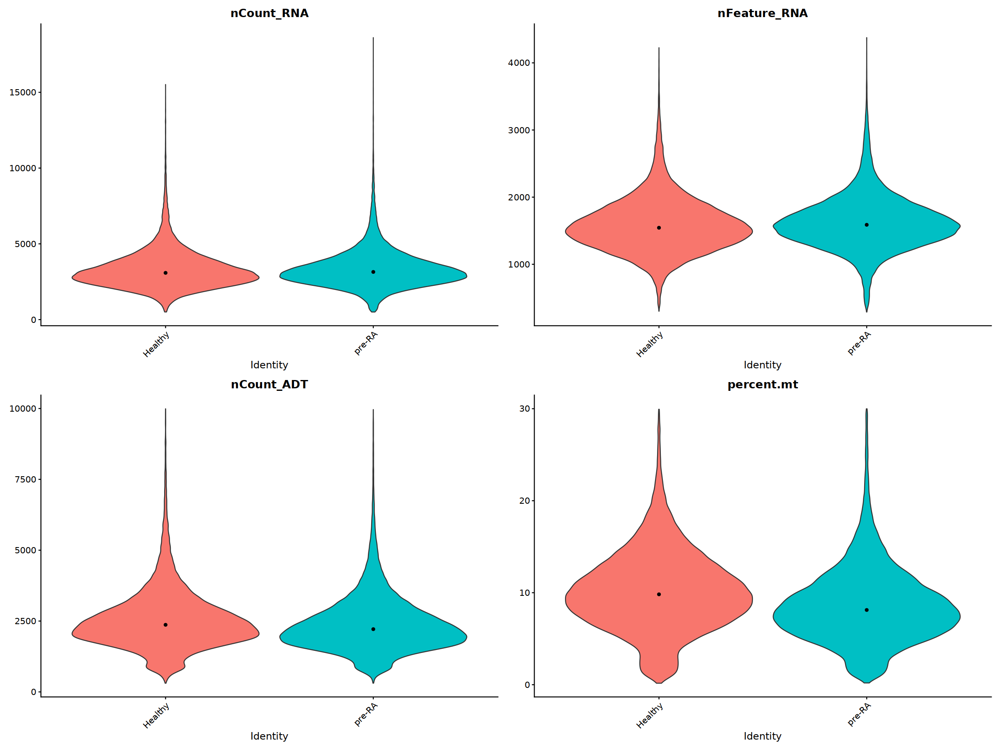

In [ ]:
VlnPlot(ra_tea_all,
    features = c("nCount_RNA", "nFeature_RNA", "nCount_ADT", "percent.mt"),
    pt.size = 0, ncol = 2,
    group.by = "cohort"
) &
    stat_summary(fun = median, geom = "point", color = "black")
ggsave(file.path(fig_path, paste0(proj_name, "_cohort_qc_plots.pdf")), width = 8, height = 6)


In [ ]:
ra_tea_all@meta.data %>%
    group_by(l1_cell_types, l2_cell_types, clean_l2_cell_types) %>%
    tally()


l1_cell_types,l2_cell_types,clean_l2_cell_types,n
<chr>,<chr>,<chr>,<int>
B cells,Activated Switched Memory B Cells,activated_switched_memory_b_cells,247
B cells,B cells C9,b_cells_c9,188
B cells,Naive B Cells,naive_b_cells,6167
B cells,Non-switched Effector B Cells,non_switched_effector_b_cells,357
B cells,Non-switched Memory B Cells,non_switched_memory_b_cells,1723
B cells,Plasma Cells,plasma_cells,101
B cells,Switched Memory B Cells,switched_memory_b_cells,1215
B cells,Transitional B Cells,transitional_b_cells,1487
HSPC,HSPCs,hspcs,66


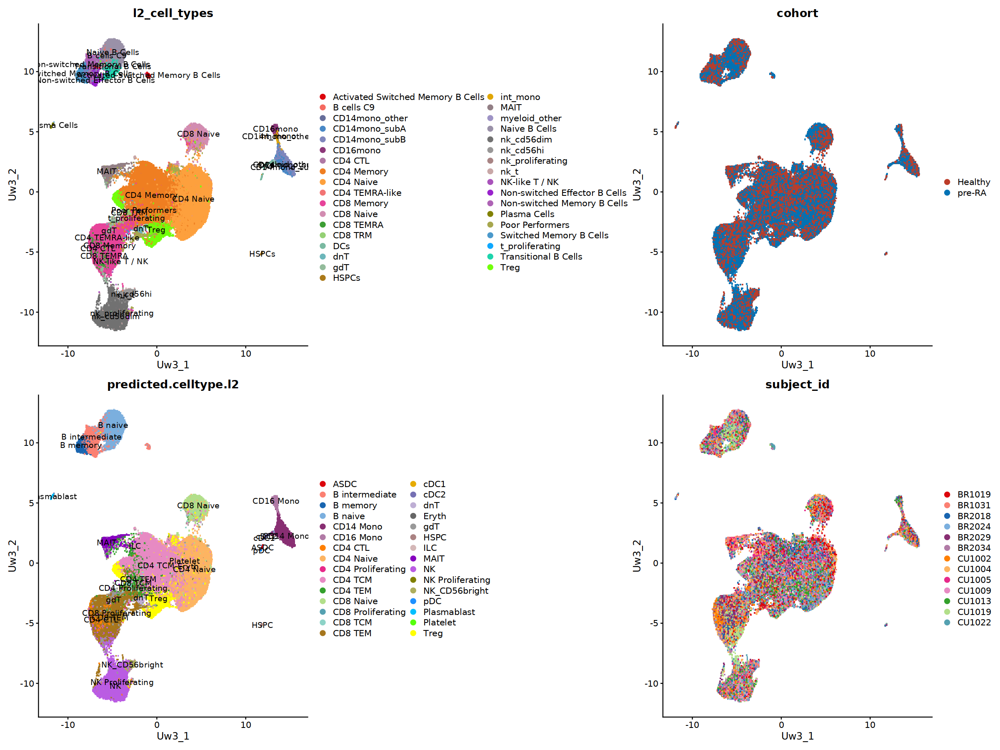

In [ ]:
# plot 3wnn umap
p1 <- DimPlot(ra_tea_all,
    label = T, reduction = "wnn.3.umap", cols = cluster_colors_ext,
    raster = TRUE, shuffle = TRUE, group.by = "l2_cell_types"
)
p3 <- DimPlot(ra_tea_all,
    group.by = "predicted.celltype.l2", raster = TRUE, shuffle = TRUE,
    cols = cluster_colors, reduction = "wnn.3.umap", label = T
)
p2 <- DimPlot(ra_tea_all,
    group.by = "cohort", raster = TRUE, shuffle = TRUE, cols = nejm_color,
    reduction = "wnn.3.umap"
)
p4 <- DimPlot(ra_tea_all,
    group.by = "subject_id", cols = cluster_colors,
    raster = TRUE, shuffle = TRUE, reduction = "wnn.3.umap"
)
p1 + p2 + p3 + p4
ggsave(file.path(fig_path, paste0(proj_name, "_wsnn_res.0.5_annotated_3wnnumap.pdf")), width = 18, height = 9)


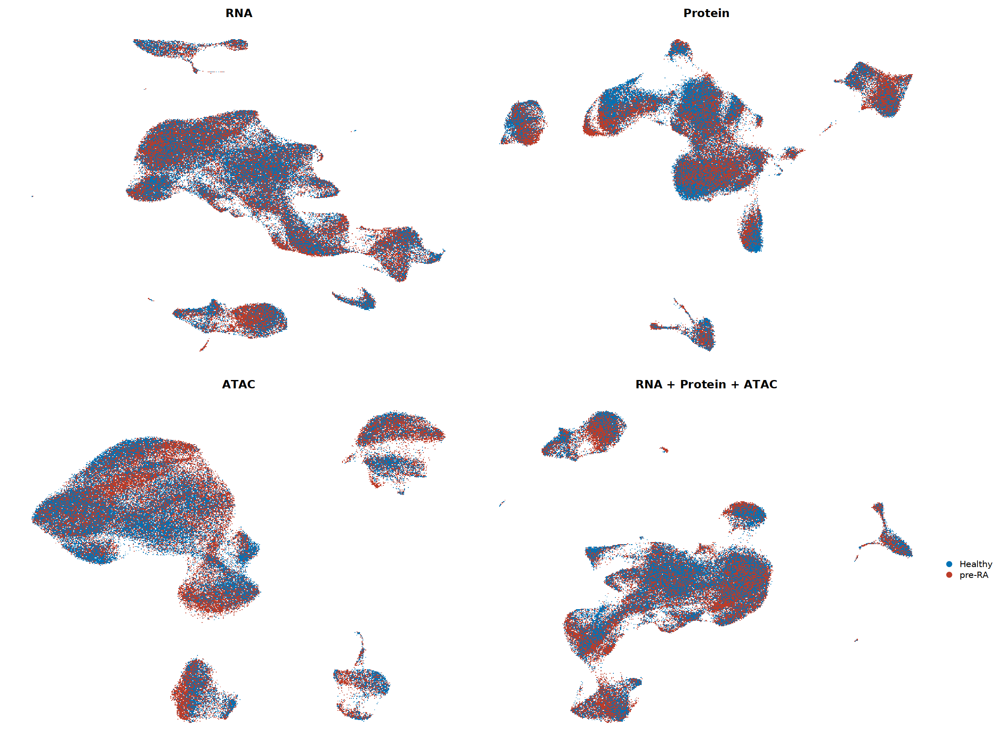

In [ ]:
rev_nejm <- c("#0072B5FF", "#BC3C29FF")
p1 <- scCustomize::DimPlot_scCustom(ra_tea_all,
    label = FALSE, repel = TRUE, raster = TRUE,
    reduction = "umap", colors_use = rev_nejm,
    group.by = "cohort"
) + NoLegend() + ggtitle("RNA") + NoAxes()
p2 <- scCustomize::DimPlot_scCustom(ra_tea_all,
    label = FALSE, repel = TRUE, raster = TRUE,
    reduction = "adt_umap", colors_use = rev_nejm,
    group.by = "cohort"
) + NoLegend() + ggtitle("Protein") + NoAxes()
p3 <- scCustomize::DimPlot_scCustom(ra_tea_all,
    label = FALSE, repel = TRUE, raster = TRUE,
    reduction = "atac_umap", colors_use = rev_nejm,
    group.by = "cohort"
) + ggtitle("ATAC") + NoLegend() + NoAxes()
p4 <- scCustomize::DimPlot_scCustom(ra_tea_all,
    label = FALSE, repel = TRUE, raster = TRUE,
    reduction = "wnn.3.umap", colors_use = rev_nejm,
    group.by = "cohort"
) + ggtitle("RNA + Protein + ATAC") + NoAxes()
p1 + p2 + p3 + p4 + plot_layout(ncol = 2)
ggsave(file.path(fig_path, paste0(proj_name, "_cohort_3modalities_umaps.png")), width = 8, height = 6)


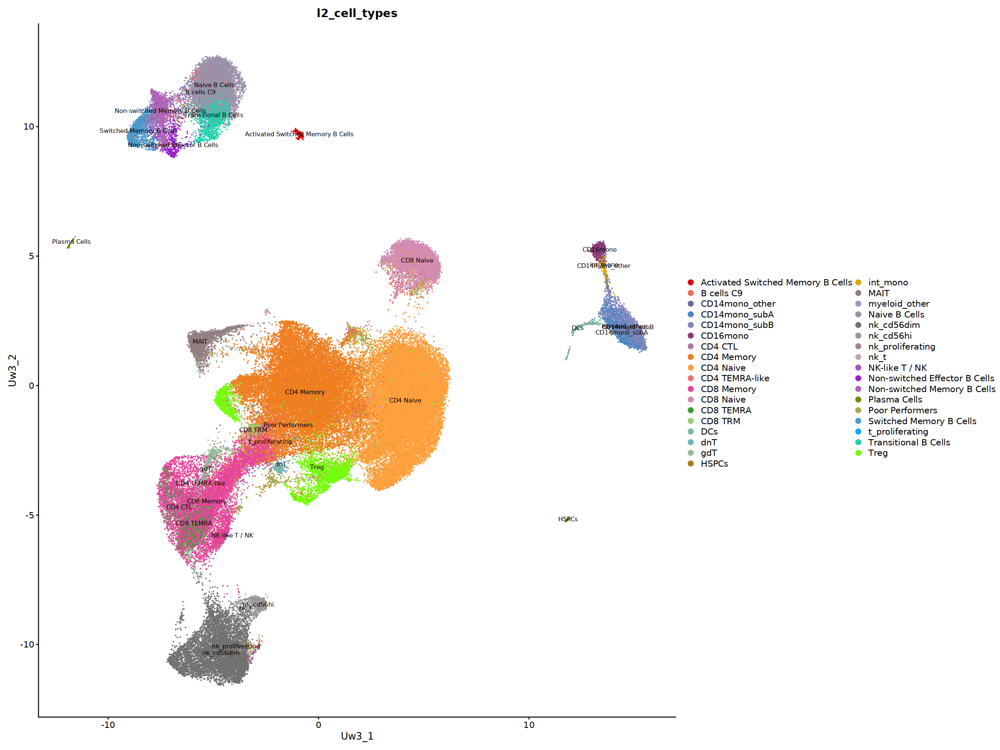

In [ ]:
# plot 3wnn umap
p1 <- DimPlot(ra_tea_all,
    label = TRUE, reduction = "wnn.3.umap", cols = cluster_colors_ext, label.size = 3,
    raster = FALSE, shuffle = TRUE, group.by = "l2_cell_types"
)
p1
ggsave(file.path(fig_path, paste0(proj_name, "_annotated_all_umap.png")), width = 12, height = 6)


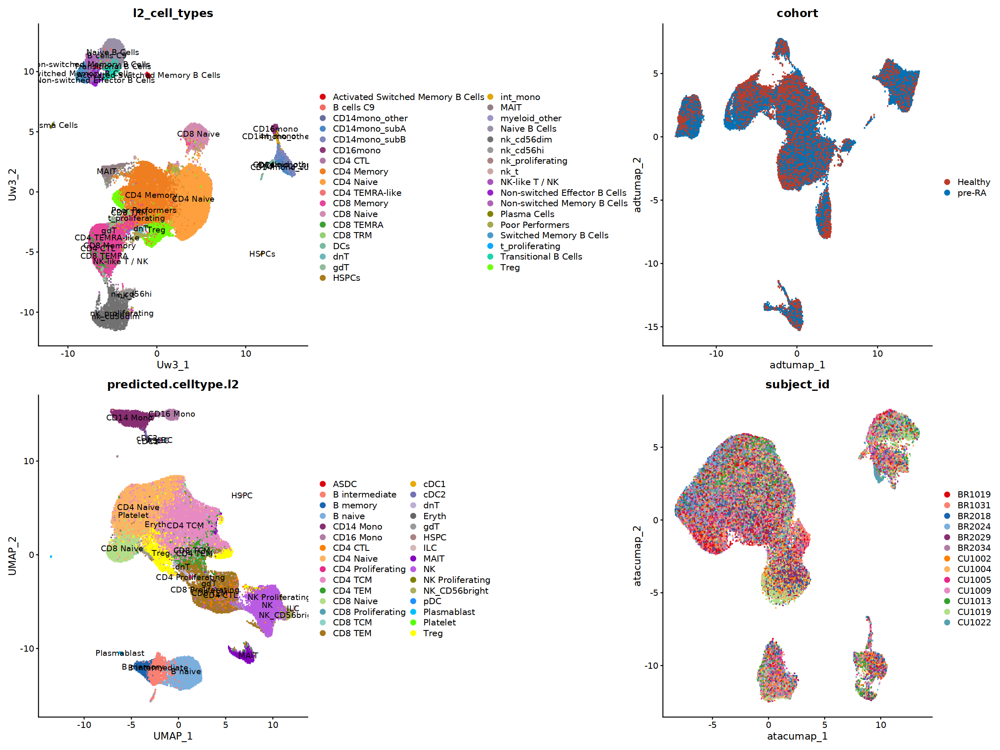

In [ ]:
# plot 3wnn umap
p1 <- DimPlot(ra_tea_all,
    label = T, reduction = "wnn.3.umap", cols = cluster_colors_ext,
    raster = TRUE, shuffle = TRUE, group.by = "l2_cell_types"
)
p3 <- DimPlot(ra_tea_all,
    group.by = "predicted.celltype.l2", raster = TRUE, shuffle = TRUE,
    cols = cluster_colors, reduction = "umap", label = T
)
p2 <- DimPlot(ra_tea_all,
    group.by = "cohort", raster = TRUE, shuffle = TRUE, cols = nejm_color,
    reduction = "adt_umap"
)
p4 <- DimPlot(ra_tea_all,
    group.by = "subject_id", cols = cluster_colors,
    raster = TRUE, shuffle = TRUE, reduction = "atac_umap"
)
p1 + p2 + p3 + p4
ggsave(file.path(fig_path, paste0(proj_name, "_annotated_all_umap.pdf")), width = 18, height = 9)


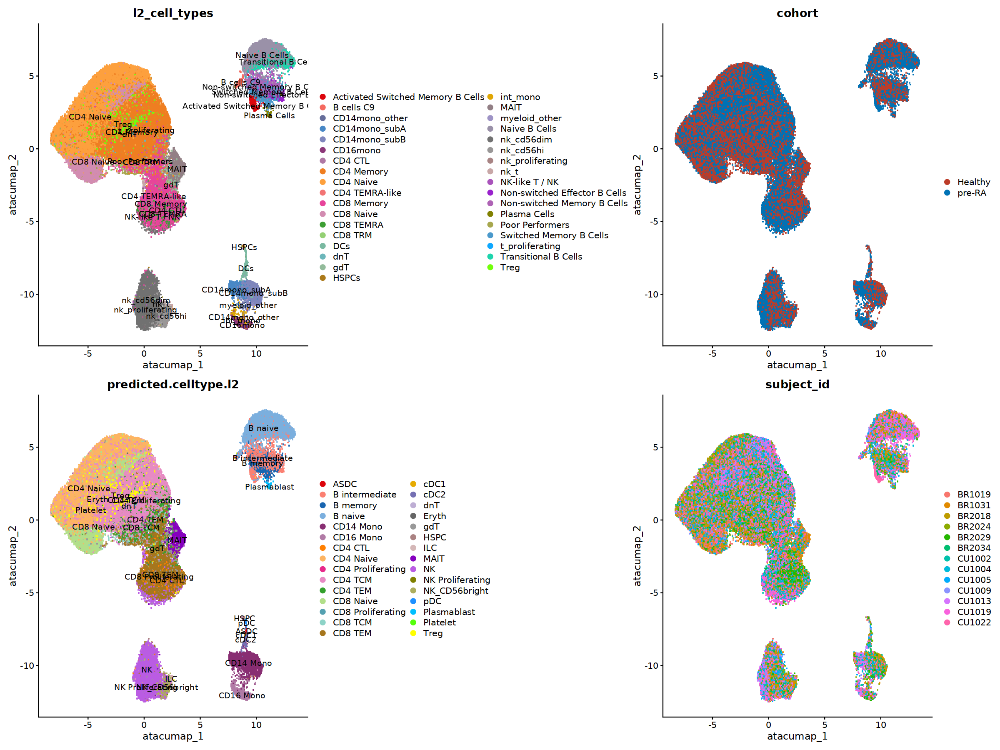

In [ ]:
# plot ATAC umap
p1 <- DimPlot(ra_tea_all,
    label = T, reduction = "atac_umap", cols = cluster_colors_ext,
    raster = TRUE, shuffle = TRUE, group.by = "l2_cell_types"
)
p3 <- DimPlot(ra_tea_all,
    group.by = "predicted.celltype.l2", raster = TRUE, shuffle = TRUE,
    cols = cluster_colors, reduction = "atac_umap", label = T
)
p2 <- DimPlot(ra_tea_all,
    group.by = "cohort", raster = TRUE, shuffle = TRUE, cols = nejm_color,
    reduction = "atac_umap"
)
p4 <- DimPlot(ra_tea_all,
    group.by = "subject_id",
    raster = TRUE, shuffle = TRUE, reduction = "atac_umap"
)
p1 + p2 + p3 + p4
ggsave(file.path(fig_path, paste0(proj_name, "_l2_cell_types_annotated_atacumap.pdf")), width = 18, height = 12)


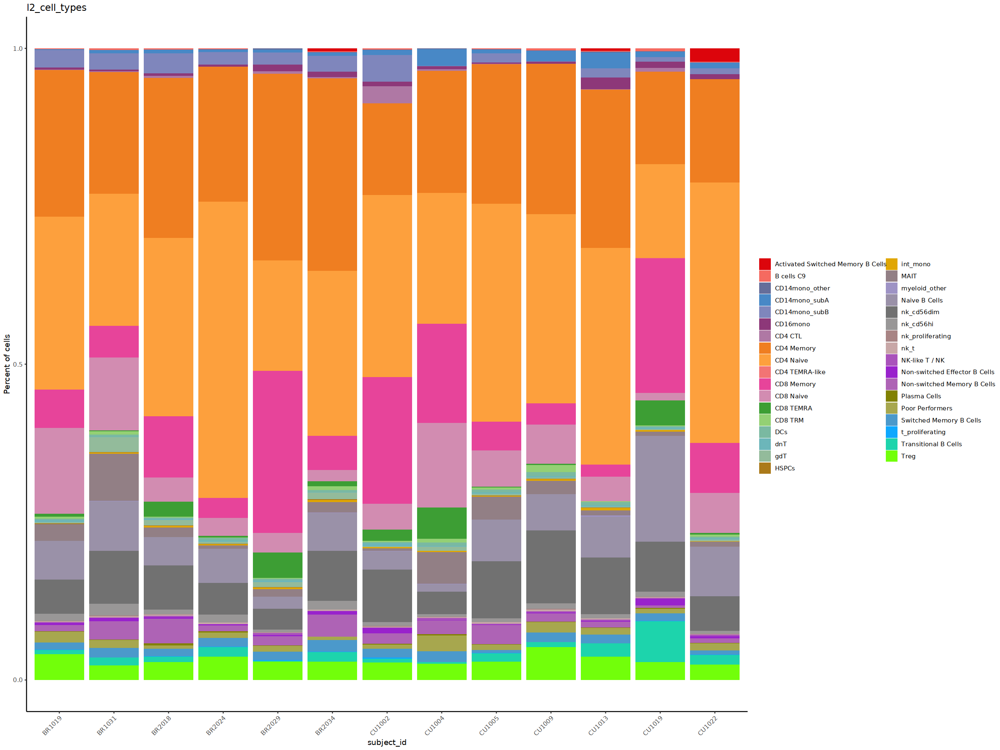

In [ ]:
dittoBarPlot(ra_tea_all, "l2_cell_types", group.by = "subject_id", color.panel = cluster_colors_ext)
ggsave(file.path(fig_path, paste0(proj_name, "_l2_cell_types_annotated_barplot.pdf")), width = 6, height = 6)


In [ ]:
# save the annotated seurat obeject
ra_tea_all %>% saveRDS(file.path(data_path, "PreRA_teaseq_seurat_qc_filtered_cells_lsi.rds"))


# psudobulk deg analysis for all l2 cells types


In [ ]:
# find all the cell types that above 100 cells enough for comparisons
ra_tea_all@meta.data %>%
     group_by(clean_l2_cell_types) %>%
     tally() %>%
     filter(n > 100)
l2_celltypes <- ra_tea_all@meta.data %>%
     group_by(clean_l2_cell_types) %>%
     tally() %>%
     filter(n > 100 & clean_l2_cell_types != "poor_performers") %>%
     pull(clean_l2_cell_types)


clean_l2_cell_types,n
<chr>,<int>
activated_switched_memory_b_cells,247
b_cells_c9,188
cd14mono_sub_a,859
cd14mono_sub_b,1804
cd16mono,637
cd4_ctl,347
cd4_memory,21021
cd4_naive,27617
cd8_memory,9689


In [ ]:
# make pseudobulk for l2 cells by subject and cell type
ra_tea_l2_pseudo <- MakeSoPseudoBulk(
    subset(ra_tea_all, clean_l2_cell_types %in% l2_celltypes),
    assay = "RNA", meta.cols = c("clean_l2_cell_types", "subject_id", "cohort", "age", "Sex"),
    celltype.col = "clean_l2_cell_types", min_expr_var = "clean_l2_cell_types", min_expr = 0.1, verbose = TRUE
)


In [ ]:
# Compute log-normalized expression values at pseudobulk value
# this is only for visulization and no need for the deg analysis which take raw counts
sizeFactors(ra_tea_l2_pseudo) <- NULL
ra_tea_l2_pseudo <- scuttle::logNormCounts(ra_tea_l2_pseudo)


In [ ]:
ra_tea_l2_pseudo


class: SingleCellExperiment 
dim: 9860 372 
metadata(0):
assays(2): counts logcounts
rownames(9860): LINC01409 CCNL2 ... AC013652.1 LINC01727
rowData names(0):
colnames: NULL
colData names(78): orig.ident nCount_RNA ... ncells sizeFactor
reducedDimNames(7): PCA UMAP ... ATAC_UMAP WNN.3.UMAP
mainExpName: RNA
altExpNames(0):

In [ ]:
# save the pseudobulk object
ra_tea_l2_pseudo %>% saveRDS(file.path(
     data_path,
     paste0(proj_name, "_all_cells_l2_subject_pseudoBulk.rds")
))


In [ ]:
# save the annotate seurat dataset
ra_tea_l2_pseudo <- readRDS(file.path(data_path, "PreRA_teaseq_nichenet_all_cells_l2_subject_pseudoBulk.rds"))


In [ ]:
# remove BR2024
ra_tea_l2_pseudo_fl <- ra_tea_l2_pseudo[, colData(ra_tea_l2_pseudo)$subject_id != "BR2024"]


### run gesa by pseudobulk logfc


In [ ]:
# load the deg list
ra_tea_l2_pseudo_degs <- read_csv(
    "/home/jupyter/data/preRA_teaseq/output_results/PreRA_teaseq_l2_annotation_PseudoBulk_degs_preRAvsHealthy.csv",
    show_col_types = FALSE
)
ra_tea_l2_pseudo_degs %>% head()


cell_type,gene,logFC,logCPM,F,PValue,FDR,contrast
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>
activated_switched_memory_b_cells,LINC01409,NA,NA,NA,NA,NA,cohortpre-RA
activated_switched_memory_b_cells,CCNL2,NA,NA,NA,NA,NA,cohortpre-RA
activated_switched_memory_b_cells,CDK11A,NA,NA,NA,NA,NA,cohortpre-RA
activated_switched_memory_b_cells,NADK,NA,NA,NA,NA,NA,cohortpre-RA
activated_switched_memory_b_cells,GNB1,NA,NA,NA,NA,NA,cohortpre-RA
activated_switched_memory_b_cells,PRKCZ,NA,NA,NA,NA,NA,cohortpre-RA


In [ ]:
ra_tea_l2_pseudo_degs %>% filter(!is.na(logFC) & !is.na(FDR) & FDR < 0.2 &
    str_detect(gene, "PLCG|RAC2|MCL1|BTK|PKC"))


ERROR: Error in ra_tea_l2_pseudo_degs %>% filter(!is.na(logFC) & !is.na(FDR) & : could not find function "%>%"


In [ ]:
ra_tea_l2_pseudo_degs %>%
    filter(!is.na(logFC) & !is.na(FDR) & FDR < 0.05) %>%
    group_by(cell_type) %>%
    tally()


cell_type,n
<chr>,<int>
b_cells_c9,2
cd14mono_sub_a,44
cd14mono_sub_b,116
cd16mono,68
cd4_ctl,1
cd4_memory,528
cd4_naive,467
cd8_memory,108
cd8_naive,201


In [ ]:
# check how many cell types have at least 30 sig degs for pathways ananlysis
ra_tea_l2_pseudo_degs %>%
    filter(!is.na(logFC) & !is.na(FDR) & FDR < 0.05) %>%
    group_by(cell_type) %>%
    tally() %>%
    filter(n >= 30)
l2_pseudo_celltypes <- ra_tea_l2_pseudo_degs %>%
    filter(!is.na(logFC) & !is.na(FDR) & FDR < 0.05) %>%
    group_by(cell_type) %>%
    tally() %>%
    filter(n >= 30) %>%
    pull(cell_type)


In [ ]:
# filter degs list for inputs
ra_tea_l2_pseudo_degs_fl <- ra_tea_l2_pseudo_degs %>%
    filter(cell_type %in% l2_pseudo_celltypes &
        !is.na(logFC))
ra_tea_l2_pseudo_degs_fl %>% head()


In [ ]:
ra_tea_l2_gsea <- RunGSEACelltype(
    logfc_list = ra_tea_l2_pseudo_degs_fl,
    gmx = gmx, ct.col = "cell_type"
)


In [ ]:
# ra_tea_t_gsea %>% filter(padj<0.05)


In [ ]:
write_csv(ra_tea_l2_gsea, file.path(
    output_path,
    paste0(proj_name, "_l2_celltypes_preRAvsHealthy_GSEA_Pathways_pseudobulk.csv")
))


In [ ]:
ra_tea_l2_gsea <- read_csv("/home/jupyter/data/preRA_teaseq/output_results/PreRA_teaseq_l2_celltypes_preRAvsHealthy_GSEA_Pathways_pseudobulk.csv")


In [ ]:
ra_tea_l2_gsea %>%
    filter(padj < 0.05) %>%
    group_by(celltype) %>%
    tally()


In [ ]:
ra_tea_l2_gsea %>%
    filter(padj < 0.05 & NES < 0) %>%
    group_by(celltype) %>%
    slice_max(order_by = abs(NES), n = 5) %>%
    select(-leadingEdge)


### run gsva for the enriched pathway


In [ ]:
# save the annotate seurat dataset
ra_tea_l2_pseudo <- readRDS(file.path(
     data_path,
     paste0(proj_name, "_all_cells_l2_subject_pseudoBulk.rds")
))


In [ ]:
# subset the cell type to do gsva
DoGSVACelltype <- function(pathways, cell_type, pseudo) {
    subtable <- pathways %>%
        filter(cell_type == cell_type & padj < 0.05) %>%
        mutate(leadingEdge = str_split(leadingEdge, ", "))
    gsLS <- subtable$leadingEdge
    names(gsLS) <- subtable$pathway
    # subset the pseudo counts
    pseudo_fl <- subset(pseudo, , clean_l2_cell_types == cell_type)

    counts <- logcounts(pseudo_fl) %>% as.data.frame()
    colnames(counts) <- pseudo_fl$subject_id

    set.seed(1234)
    ssgsea_res <- GSVA::gsva(data.matrix(counts),
        gsLS,
        method = "ssgsea",
        abs.ranking = FALSE,
        min.sz = 5,
        max.sz = 2000,
        ssgsea.norm = T
    )
    ssgsea_res <- t(scale(t(ssgsea_res))) %>%
        as_tibble(rownames = "pathway") %>%
        mutate(pathway_ct = paste(pathway, cell_type, sep = "_"))
    return(ssgsea_res)
}


In [ ]:
pw_select <- ra_tea_l2_gsea %>%
    filter(padj < 0.05 & celltype != "cd14mono_sub_a") %>%
    group_by(celltype) %>%
    slice_min(order_by = abs(padj), n = 10) %>%
    ungroup() %>%
    group_by(pathway) %>%
    mutate(shared_celltypes = n()) %>%
    arrange(desc(shared_celltypes), pathway) %>%
    # filter(shared_celltypes>2)  %>%
    distinct(pathway) %>%
    pull(pathway)


In [ ]:
ra_tea_l2_gsea %>% filter(padj < 0.05 & celltype != "cd14mono_sub_a" & str_detect(pathway, "LYSO"))


In [ ]:
pw_select <- c(
    "REACTOME_IMMUNOREGULATORY_INTERACTIONS_BETWEEN_A_LYMPHOID_AND_A_NON_LYMPHOID_CELL",
    "HALLMARK_TNFA_SIGNALING_VIA_NFKB",
    "KEGG_LYSOSOME",
    "REACTOME_NEUTROPHIL_DEGRANULATION"
)


In [ ]:
# run gsva for each cell type and combine
ssgsea_l2_res <- ra_tea_l2_gsea %>%
    filter(pathway %in% pw_select & celltype != "cd14mono_sub_a") %>%
    group_by(celltype) %>%
    group_modify(~ DoGSVACelltype(.x, .y$celltype, ra_tea_l2_pseudo)) %>%
    ungroup()


In [ ]:
# set up the cell type colors annotations
l2_ct_levs <- c(
    "cd14mono_sub_b", "cd16mono", "int_mono", "dcs", "nk_cd56dim",
    "cd4_naive", "cd4_memory", "cd8_naive", "cd8_memory", "treg", "mait",
    "naive_b_cells", "non_switched_memory_b_cells", "switched_memory_b_cells"
)
l2_ct_levs_color <- cluster_colors[1:length(l2_ct_levs)]
names(l2_ct_levs_color) <- l2_ct_levs
l2_ct_levs_color


In [ ]:
ssgsea_l2_res %>% head()


In [ ]:
ssgsea_l2_res %>% head()
colData(ra_tea_l2_pseudo) %>%
    as_tibble() %>%
    distinct(subject_id, cohort)


In [ ]:
# pathwayDF %>% distinct(celltype) %>% mutate(colors=cluster_colors[1:10]) %>%
#     mutate(ct_colors=paste0("'", celltype, "' = '", colors, "'")) %>% select(ct_colors)
GSVAHeatmap <- function(gsva_res, pseudo) {
    library(ComplexHeatmap)
    # set up the column annotation
    col_data <- colData(pseudo) %>%
        as_tibble() %>%
        distinct(subject_id, cohort) %>%
        arrange(subject_id)

    col_anno <- HeatmapAnnotation(
        cohort = col_data$cohort,
        col = list(cohort = c("Healthy" = "#BC3C29FF", "pre-RA" = "#0072B5FF"))
    )
    # # set up the data matrix
    matrix <- gsva_res %>%
        select_if(is.numeric) %>%
        as.matrix()
    rownames(matrix) <- gsva_res %>% pull(pathway)
    all(rownames(col_anno) == colnames(matrix))
    # # set up the row annotation
    row_anno <- rowAnnotation(
        Celltype = gsva_res$celltype,
        col = list(Celltype = l2_ct_levs_color)
    )
    p1 <- ComplexHeatmap::Heatmap(matrix,
        top_annotation = col_anno, row_split = gsva_res$celltype,
        left_annotation = row_anno,
        cluster_rows = FALSE,
        row_names_gp = gpar(fontsize = 8),
        heatmap_legend_param = list(
            title = "GSVA enrichment scores"
        )
    )
    p1
}


In [ ]:
pdf(file.path(fig_path, paste0(proj_name, "_pseudobulk_Age_GSEA_pathways_selected_GSVAHeatmap.pdf")),
       width = 18, height = 12
)
p1 <- GSVAHeatmap(ssgsea_l2_res, ra_tea_l2_pseudo)
draw(p1)
dev.off()


In [ ]:
# subset the cell type to do gsva
cell_type <- "CD4 CM"
DoGSVAheatmap <- function(gsea_list, pseudo, cell_type) {
    subtable <- gsea_list %>%
        filter(celltype == cell_type & padj < 0.05) %>%
        mutate(leadingEdge = str_split(leadingEdge, ", "))
    gsLS <- subtable$leadingEdge
    names(gsLS) <- subtable$pathway
    # subset the pseudo counts
    pseudo_fl <- subset(pseudo, , clean_l2_cell_types == cell_type)

    counts <- logcounts(pseudo_fl) %>% as.data.frame()
    colnames(counts) <- pseudo_fl$subject_id

    set.seed(1234)
    ssgsea_res <- GSVA::gsva(data.matrix(counts),
        gsLS,
        method = "ssgsea",
        abs.ranking = FALSE,
        min.sz = 5,
        max.sz = 2000,
        ssgsea.norm = T
    )

    ssgsea_res <- t(scale(t(ssgsea_res)))
    library(pheatmap)
    p1 <- ComplexHeatmap::Heatmap(ssgsea_res, column_title = celltype, name = "gsva score", width = 12, height = 8)
    return(p1)
}


In [ ]:
# plot for all cell types
for (ct in l2_ct_levs) {
    p2 <- DoGSVAheatmap(ra_tea_l2_gsea, ra_tea_l2_pseudo, ct)
    pdf(file.path(fig_path, paste0(proj_name, "_pseudobulk_Age_GSEA_pathways_", ct, "_GSVAHeatmap.pdf")),
        width = 12, height = 8
    )
    draw(p2)
    dev.off()
}


In [ ]:
ra_tea_l2_gsea %>%
    filter(padj < 0.05) %>%
    group_by(celltype) %>%
    slice_min(order_by = abs(padj), n = 10) %>%
    ungroup() %>%
    group_by(pathway) %>%
    mutate(shared_celltypes = n()) %>%
    arrange(desc(shared_celltypes), pathway) %>%
    filter(shared_celltypes > 3) %>%
    select(-leadingEdge) %>%
    distinct(pathway)


In [ ]:
ra_tea_l2_gsea %>%
    distinct(celltype) %>%
    pull(celltype)


In [ ]:
# make plotting data frame
l2_ct_levs <- c(
    "cd14mono_sub_b", "cd16mono", "int_mono", "dcs", "nk_cd56dim",
    "cd4_naive", "cd4_memory", "cd8_naive", "cd8_memory", "treg", "mait",
    "naive_b_cells", "non_switched_memory_b_cells", "switched_memory_b_cells"
)
ra_tea_l2_gsea_fl <- ra_tea_l2_gsea %>%
    filter(padj < 0.05 & celltype != "cd14mono_sub_a") %>%
    group_by(celltype) %>%
    slice_min(order_by = abs(padj), n = 5) %>%
    ungroup() %>%
    group_by(pathway) %>%
    mutate(shared_celltypes = n()) %>%
    arrange(desc(shared_celltypes), pathway) %>%
    # filter(shared_celltypes>3) %>%
    ungroup() %>%
    mutate(
        group = ifelse(NES > 0, "up", "down"),
        pID = c(1:length(pathway))
    ) %>%
    group_by(pID) %>%
    mutate(
        lesize = length(unlist(strsplit(leadingEdge, ","))),
        celltype = factor(celltype, levels = l2_ct_levs)
    ) %>%
    as_tibble() %>%
    arrange(desc(shared_celltypes))


# determine pathway size
gsSize <- data.frame(gsize = sapply(gmx, function(x) length(x))) %>%
    rownames_to_column(var = "pathway")

# calculate propotion of genes enriched (#leading edge genes/size of pathway)
ra_tea_l2_gsea_fl <- ra_tea_l2_gsea_fl %>%
    mutate(
        gsize = gsSize$gsize[match(pathway,
            table = gsSize$pathway
        )],
        propGenes = (lesize / gsize) * 100
    )


In [ ]:
# making a dot plot for the pathways for the main fig
p1 <- ggplot(
     data = ra_tea_l2_gsea_fl,
     mapping = aes(x = celltype, y = pathway)
) +
     geom_point(aes(color = NES, size = propGenes)) +
     scale_color_gradientn(
          colors = c("blue", "white", "red"),
          limit = c(-3, 3)
     ) +
     theme_bw() +
     theme(
          plot.title = element_text(hjust = 0.5),
          axis.text.x = element_text(angle = 90, vjust = 0.5, size = 14),
          axis.text.y = element_text(size = 12),
          strip.text.x = element_text(size = 12)
     ) +
     scale_size(
          range = c(2, 10),
          limit = c(1, 100),
          breaks = c(1, 10, 30, 50, 80)
     ) +
     # facet_wrap(vars(comparisons))+
     labs(
          title = NULL,
          x = NULL,
          y = "Pathway",
          color = "GSEA Normalized Enrichment Score",
          size = "% Genes enriched"
     )
p1
ggsave(file.path(fig_path, paste0(proj_name, "_l2_celltypes_GSEA_pathway_share3.pdf")), width = 16, height = 12)


In [ ]:
# making a dot plot for the pathways for the main fig
p1 <- ggplot(
     data = ra_tea_l2_gsea_fl,
     mapping = aes(x = celltype, y = pathway)
) +
     geom_point(aes(color = NES, size = propGenes)) +
     scale_color_gradientn(
          colors = c("blue", "white", "red"),
          limit = c(-3, 3)
     ) +
     theme_bw() +
     theme(
          plot.title = element_text(hjust = 0.5),
          axis.text.x = element_text(angle = 90, vjust = 0.5, size = 14),
          axis.text.y = element_text(size = 12),
          strip.text.x = element_text(size = 12)
     ) +
     scale_size(
          range = c(2, 10),
          limit = c(1, 100),
          breaks = c(1, 10, 30, 50, 80)
     ) +
     # facet_wrap(vars(comparisons))+
     labs(
          title = NULL,
          x = NULL,
          y = "Pathway",
          color = "GSEA Normalized Enrichment Score",
          size = "% Genes enriched"
     )
p1
ggsave(file.path(fig_path, paste0(proj_name, "_l2_celltypes_GSEA_pathway_top5.pdf")), width = 16, height = 12)


In [ ]:
### check TNFa signaling pathway


# deep deive in the DEGs


In [ ]:
# load the annotate seurat dataset
ra_tea_l2_pseudo <- readRDS(file.path(data_path, "PreRA_teaseq_nichenet_all_cells_l2_subject_pseudoBulk.rds"))


In [ ]:
# remove BR2024
ra_tea_l2_pseudo_fl <- ra_tea_l2_pseudo[, colData(ra_tea_l2_pseudo)$subject_id != "BR2024"]
ra_tea_l2_pseudo_fl


class: SingleCellExperiment 
dim: 9860 343 
metadata(0):
assays(2): counts logcounts
rownames(9860): LINC01409 CCNL2 ... AC013652.1 LINC01727
rowData names(0):
colnames: NULL
colData names(78): orig.ident nCount_RNA ... ncells sizeFactor
reducedDimNames(7): PCA UMAP ... ATAC_UMAP WNN.3.UMAP
mainExpName: RNA
altExpNames(0):

In [ ]:
rownames(ra_tea_l2_pseudo_fl) %>% str_subset("CD40")


[1] "CD40"   "CD40LG"

In [ ]:
colData(ra_tea_l2_pseudo)$subject_id %>% unique()


[1] "BR1019" "BR2018" "BR2024" "BR2029" "BR2034" "CU1009" "CU1013" "CU1019"
 [9] "CU1022" "BR1031" "CU1002" "CU1004" "CU1005"

In [ ]:
# load the deg list
ra_tea_l2_pseudo_degs <-
    read_csv(
        "/home/jupyter/data/preRA_teaseq/output_results/integrated_analysis/PreRA_teaseq_integrated_analysis_l2_annotation_PseudoBulk_degs_rmBR2024.csv",
        show_col_types = FALSE
    ) %>%
    filter(!is.na(FDR) & !is.na(logFC)) %>%
    mutate(direction = if_else(logFC > 0, "up", "down"))
ra_tea_l2_pseudo_degs %>% head()


cell_type,gene,logFC,logCPM,F,PValue,FDR,contrast,direction
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>
activated_switched_memory_b_cells,RERE,0.0725634,9.711322,0.01974607,0.8904613,0.9779627,cohortpre-RA,up
activated_switched_memory_b_cells,ROR1,-0.1344606,10.369113,0.04144220,0.8419247,0.9779627,cohortpre-RA,down
activated_switched_memory_b_cells,LINC01362,-0.5766158,9.179738,0.46388427,0.5080901,0.9779627,cohortpre-RA,down
activated_switched_memory_b_cells,DIPK1A,0.2002758,9.312744,0.06993404,0.7956921,0.9779627,cohortpre-RA,up
activated_switched_memory_b_cells,VAV3,0.4162032,9.558827,0.77533755,0.3949912,0.9779627,cohortpre-RA,up
activated_switched_memory_b_cells,FCRL5,1.2674587,9.617751,2.69358865,0.1253646,0.9779627,cohortpre-RA,up


In [ ]:
ra_tea_l2_pseudo_degs %>% distinct(contrast)


contrast
<chr>
cohortpre-RA


In [ ]:
ra_tea_l2_pseudo_degs %>% filter(str_detect(gene, "TLR9"))


cell_type,gene,logFC,logCPM,F,PValue,FDR,contrast,direction
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>


In [ ]:
ra_tea_l2_pseudo_degs %>% filter(str_detect(gene, "NDUFA|ATP|MT") &
    str_detect(cell_type, "cd4") & FDR < 0.05)


In [ ]:
# load the pathway ananlysis
ra_tea_l2_gsea <- read_csv(
    "/home/jupyter/data/preRA_teaseq/output_results/PreRA_teaseq_l2_celltypes_preRAvsHealthy_GSEA_Pathways_pseudobulk.csv"
)


Rows: 14305 Columns: 6
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (3): pathway, leadingEdge, celltype
dbl (3): pval, padj, NES

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.


In [ ]:
# ra_tea_l2_gsea %>% filter(str_detect(celltype,'cd4')&padj<0.05)


In [ ]:
# plot the deg counts
l2_cellcounts <- ra_tea_all@meta.data %>%
     group_by(clean_l2_cell_types) %>%
     tally(name = "cell_counts") %>%
     filter(cell_counts > 100) %>%
     arrange(desc(cell_counts))
l2_cellcounts %>% head()
l2_cellcounts$clean_l2_cell_types[!l2_cellcounts$clean_l2_cell_types %in% ra_tea_l2_pseudo_degs$cell_type]


ERROR: Error in group_by(., clean_l2_cell_types): object 'ra_tea_all' not found


In [ ]:
l2_cellcounts <- read_csv("/home/jupyter/data/preRA_teaseq/output_results/integrated_analysis/PreRA_teaseq_integrated_analysisl2_celltype_counts.csv")
l2_cellcounts %>% head()


Rows: 440 Columns: 6
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (3): subject_id, l2_cell_types, cohort
dbl (3): counts, frequency, total_counts

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.


subject_id,l2_cell_types,cohort,counts,frequency,total_counts
<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>
BR1019,Activated Switched Memory B Cells,Healthy,1,0.0001149029,8703
BR1019,B cells C9,Healthy,13,0.0014937378,8703
BR1019,CD14mono_other,Healthy,1,0.0001149029,8703
BR1019,CD14mono_subA,Healthy,13,0.0014937378,8703
BR1019,CD14mono_subB,Healthy,240,0.0275766977,8703
BR1019,CD16mono,Healthy,27,0.0031023785,8703


In [ ]:
# check number of genes being tested
gene_counts <- ra_tea_l2_pseudo_degs %>%
    mutate(cell_type = factor(cell_type, levels = l2_cellcounts$clean_l2_cell_types)) %>%
    group_by(cell_type) %>%
    summarise(gene_counts = n())
gene_counts %>% head()


ERROR: [1m[33mError[39m in `mutate()`:[22m
[1m[22m[33m![39m Problem while computing `cell_type = factor(cell_type, levels =
  l2_cellcounts$clean_l2_cell_types)`.
[1mCaused by error in `factor()`:[22m
[33m![39m object 'l2_cellcounts' not found


In [ ]:
# # calculate the deg counts per cell types
# deg_counts <- ra_tea_l2_pseudo_degs %>%
#     mutate(cell_type=factor(cell_type, levels = l2_cellcounts$clean_l2_cell_types)) %>%
#     dplyr::filter(FDR<0.05 & abs(logFC)>0.1) %>%
#     group_by(cell_type, direction) %>% summarise(deg_counts=n()) %>%
#     mutate(deg_counts=if_else(direction=='up', deg_counts, -deg_counts),
#           enriched=if_else(direction=='up', 'preRA', 'Healthy')) %>%
#     left_join(l2_cellcounts, by = c("cell_type" = "clean_l2_cell_types")) %>%
#     ungroup() %>% left_join(gene_counts, by = 'cell_type')
# deg_counts


In [ ]:
deg_counts <- ra_tea_l2_pseudo_degs %>%
      # mutate(cell_type=factor(cell_type, levels = l2_cellcounts$clean_l2_cell_types)) %>%
      dplyr::filter(FDR < 0.05 & abs(logFC) > 0.1) %>%
      group_by(cell_type, direction) %>%
      dplyr::summarise(deg_counts = n()) %>%
      mutate(
            deg_counts = if_else(direction == "up", deg_counts, -deg_counts),
            enriched = if_else(direction == "up", "At-risk", "Healthy")
      ) %>%
      ungroup() %>%
      arrange(desc(abs(deg_counts))) %>%
      mutate(cell_type = factor(cell_type, levels = unique(cell_type)))
deg_counts %>% head()


`summarise()` has grouped output by 'cell_type'. You can override using the
`.groups` argument.


cell_type,direction,deg_counts,enriched
<fct>,<chr>,<int>,<chr>
cd4_memory,down,-324,Healthy
cd4_naive,up,248,At-risk
cd4_naive,down,-219,Healthy
cd4_memory,up,204,At-risk
nk_cd56dim,down,-114,Healthy
cd8_naive,down,-109,Healthy


In [ ]:
nejm_color


[1] "#BC3C29FF" "#0072B5FF" "#E18727FF" "#20854EFF" "#7876B1FF" "#6F99ADFF"
[7] "#FFDC91FF" "#EE4C97FF"

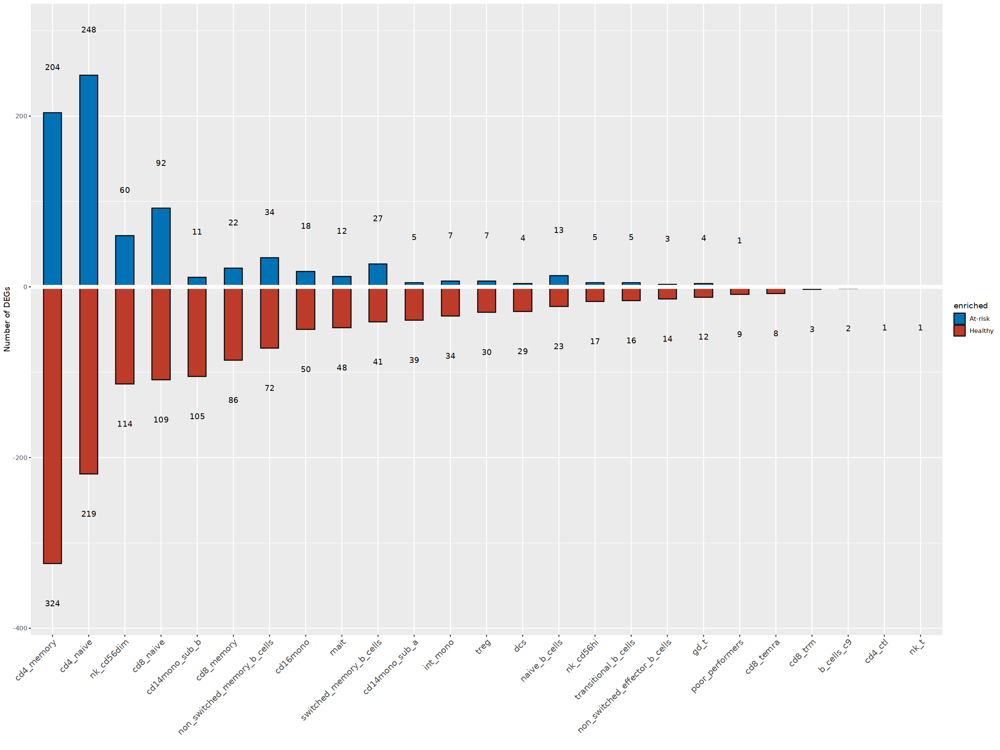

In [ ]:
# plot the deg counts
p1 <- ggplot(deg_counts, aes(width = 0.5, fill = enriched, y = deg_counts, x = cell_type)) +
  geom_bar(stat = "identity", color = "black") +
  geom_hline(yintercept = 0, color = "white", size = 2) +
  # scale_y_continuous(breaks = seq(-2000, 1200, by = 200)) +
  geom_text(aes(y = deg_counts + 50 * sign(deg_counts), label = abs(deg_counts)), vjust = 0, size = 4) +
  ylab("Number of DEGs") +
  xlab("") +
  theme(
    axis.text.x = element_text(angle = 45, hjust = 1, vjust = 1, size = 12),
    strip.text = element_text(size = 16)
  ) +
  scale_fill_manual(values = c("#0072B5FF", "#BC3C29FF"))
# Adding line to differentiate -ve and +ve y axis
p1
ggsave(file.path(fig_path, paste0(proj_name, "_l2_celltype_PseudoBulk_degs_counts.pdf")),
  width = 12, height = 8
)


In [ ]:
deg_counts <- deg_counts %>%
    arrange((abs(deg_counts))) %>%
    mutate(cell_type = fct_rev(cell_type))
deg_counts$cell_type %>% levels()


[1] "cd4_ctl"                       "nk_t"                         
 [3] "poor_performers"               "b_cells_c9"                   
 [5] "cd8_trm"                       "non_switched_effector_b_cells"
 [7] "dcs"                           "gd_t"                         
 [9] "cd14mono_sub_a"                "nk_cd56hi"                    
[11] "transitional_b_cells"          "int_mono"                     
[13] "treg"                          "cd8_temra"                    
[15] "cd14mono_sub_b"                "mait"                         
[17] "naive_b_cells"                 "cd16mono"                     
[19] "cd8_memory"                    "switched_memory_b_cells"      
[21] "non_switched_memory_b_cells"   "nk_cd56dim"                   
[23] "cd8_naive"                     "cd4_memory"                   
[25] "cd4_naive"

Warning message:
“Vectorized input to `element_text()` is not officially supported.
ℹ Results may be unexpected or may change in future versions of ggplot2.”


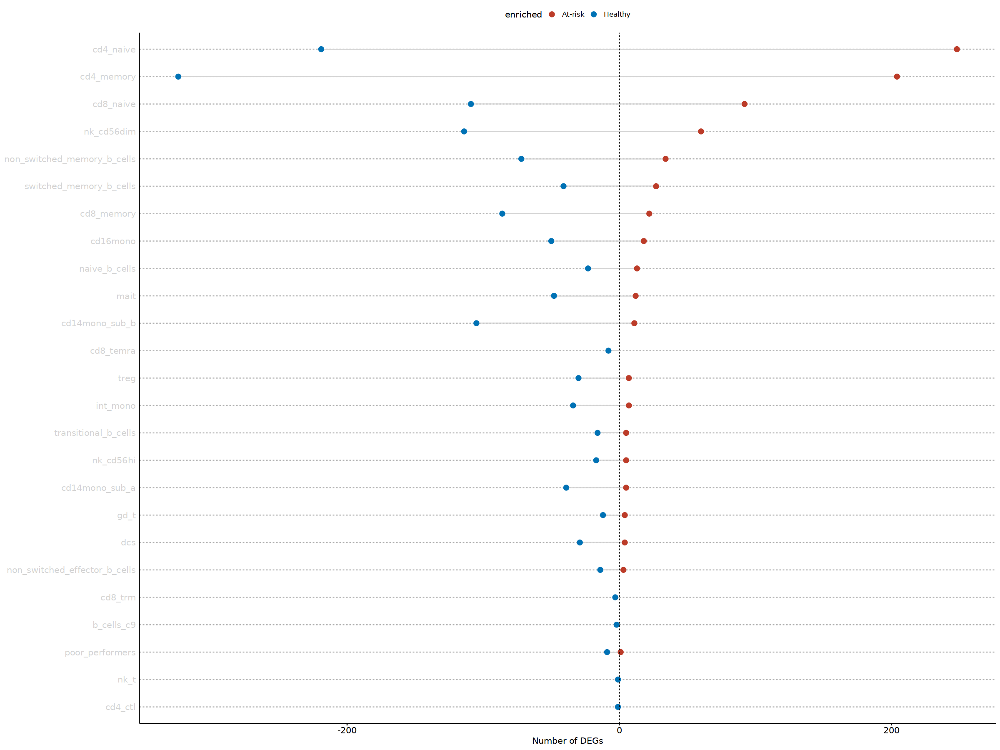

In [ ]:
# plot dot plot of top features

ggpubr::ggdotchart(deg_counts,
        x = "cell_type", y = "deg_counts",
        color = "enriched", # Color by groups
        palette = nejm_color, # Custom color palette
        sorting = "none", # Sort value in descending order
        rotate = TRUE, ylab = "Number of DEGs", # Rotate vertically
        dot.size = 3, # Large dot size
        y.text.col = TRUE, add = "segment", # Color y text by groups
        ggtheme = theme_pubr() # ggplot2 theme
) +
        theme_cleveland() + geom_hline(yintercept = 0, linetype = 2)
ggsave(file.path(fig_path, paste0(proj_name, "_l2_celltype_PseudoBulk_degs_counts_dotplot.pdf")),
        width = 6, height = 6
)


`summarise()` has grouped output by 'cell_type'. You can override using the `.groups` argument.


cell_type,deg_counts,cell_counts,gene_counts
<fct>,<int>,<int>,<int>
b_cells_c9,2,188,1697
cd14mono_sub_a,44,859,5257
cd14mono_sub_b,116,1804,7927
cd16mono,68,637,4343
cd4_ctl,1,347,885
cd4_memory,528,21021,9383


Warning message:
“ggrepel: 14 unlabeled data points (too many overlaps). Consider increasing max.overlaps”
Warning message:
“ggrepel: 2 unlabeled data points (too many overlaps). Consider increasing max.overlaps”
Warning message:
“ggrepel: 13 unlabeled data points (too many overlaps). Consider increasing max.overlaps”
Warning message:
“ggrepel: 6 unlabeled data points (too many overlaps). Consider increasing max.overlaps”


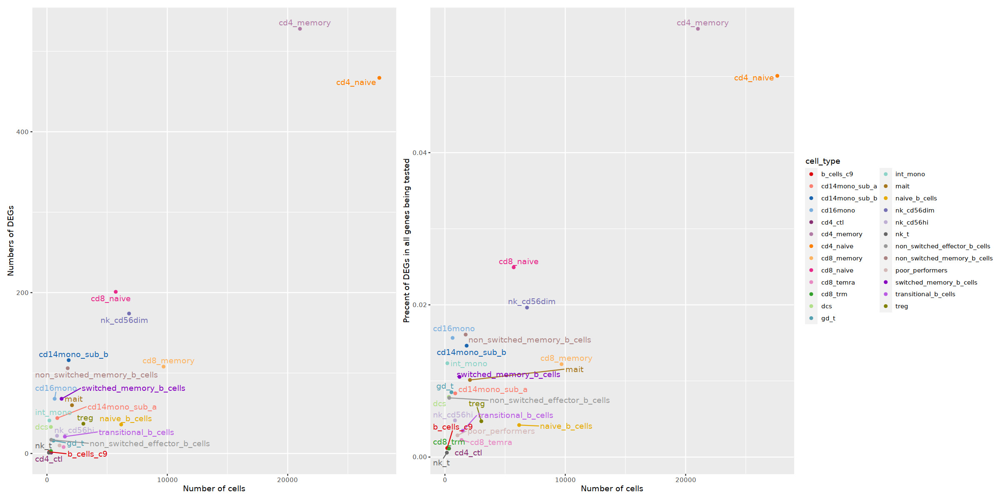

In [ ]:
options(repr.plot.width = 20, repr.plot.height = 10)
deg_counts_total <- deg_counts %>%
    group_by(cell_type) %>%
    summarise(
        deg_counts = sum(abs(deg_counts)),
        cell_counts = cell_counts, gene_counts = gene_counts
    ) %>%
    distinct() %>%
    mutate(cell_type = factor(cell_type))
deg_counts_total %>% head()
p1 <- deg_counts_total %>%
    ggplot(aes(y = deg_counts, x = cell_counts, color = cell_type)) +
    geom_point() +
    ggrepel::geom_text_repel(aes(label = cell_type)) +
    scale_color_manual(values = cluster_colors) +
    xlab("Number of cells") +
    theme(legend.position = "none") +
    ylab("Numbers of DEGs")
p2 <- deg_counts_total %>%
    ggplot(aes(y = deg_counts / gene_counts, x = cell_counts, color = cell_type)) +
    geom_point() +
    ggrepel::geom_text_repel(aes(label = cell_type), show.legend = FALSE) +
    scale_color_manual(values = cluster_colors) +
    xlab("Number of cells") +
    ylab("Precent of DEGs in all genes being tested")
p1 + p2

ggsave(file.path(fig_path, paste0(proj_name, "_l2_celltype_PseudoBulk_degs_by_cell_counts.pdf")),
    width = 12, height = 6
)


# load deps from MOCHA


In [ ]:
# save the differential results
deps_l2 <- fread(
    "/home/jupyter/data/preRA_teaseq/output_results/atac/preRA_teaseq_scMACS_l2_celltype_DAPs_RAvsHealthy.tsv"
) %>%
    as_tibble() %>%
    dplyr::rename("gene" = "Gene", "cell_type" = "CellPopulation") %>%
    mutate(direction = if_else(MeanDiff > 0, "up", "down"))
deps_l2 %>% head()


Tile,cell_type,Foreground,Background,P_value,Test-Statistic,FDR,Log2FC_C,MeanDiff,Avg_Intensity_Case,Pct0_Case,Avg_Intensity_Control,Pct0_Control,tileType,gene,direction
<chr>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<chr>
chr1:1000000-1000499,cd14mono_sub_a,pre-RA,Healthy,0.94556612,0.1119429,0.9510648,-0.01347280,2.0159066,3.738285,0,3.764950,0.1666667,Promoter,A1BG,up
chr1:100036500-100036999,cd14mono_sub_a,pre-RA,Healthy,NA,NA,NA,NA,4.6977226,NA,NA,NA,NA,Promoter,AKT3,up
chr1:100037500-100037999,cd14mono_sub_a,pre-RA,Healthy,0.13361440,2.2500000,0.8458910,-0.06538264,-0.6874248,3.762812,0,3.838443,0.0000000,Exonic,ADA,down
chr1:100038000-100038499,cd14mono_sub_a,pre-RA,Healthy,0.01241933,6.2500000,0.8294123,-0.04838460,-0.5264762,3.953707,0,3.999742,0.0000000,Exonic,ADA,down
chr1:100038500-100038999,cd14mono_sub_a,pre-RA,Healthy,0.94556612,0.1119429,0.9510648,-0.01721306,1.8584018,3.812074,0,3.829287,0.1666667,Distal,,up
chr1:100046500-100046999,cd14mono_sub_a,pre-RA,Healthy,NA,NA,NA,NA,7.0730822,NA,NA,NA,NA,Distal,,up


In [ ]:
deps_l2 %>%
    dplyr::filter(FDR < 0.2) %>%
    group_by(cell_type) %>%
    tally()


cell_type,n
<chr>,<int>
cd4_memory,8841
cd4_naive,2259


In [ ]:
# calculate the deps counts per cell types
dep_counts <- deps_l2 %>%
    mutate(cell_type = factor(cell_type, levels = l2_cellcounts$clean_l2_cell_types)) %>%
    dplyr::filter(FDR < 0.2) %>%
    group_by(cell_type, direction) %>%
    summarise(dep_counts = n()) %>%
    mutate(
        dep_counts = if_else(direction == "up", dep_counts, -dep_counts),
        enriched = if_else(direction == "up", "preRA", "Healthy")
    ) %>%
    left_join(l2_cellcounts, by = c("cell_type" = "clean_l2_cell_types")) %>%
    ungroup()
dep_counts


`summarise()` has grouped output by 'cell_type'. You can override using the `.groups` argument.


cell_type,direction,dep_counts,enriched,cell_counts
<chr>,<chr>,<int>,<chr>,<int>
cd4_naive,down,-1099,Healthy,27617
cd4_naive,up,1160,preRA,27617
cd4_memory,down,-4250,Healthy,21021
cd4_memory,up,4591,preRA,21021


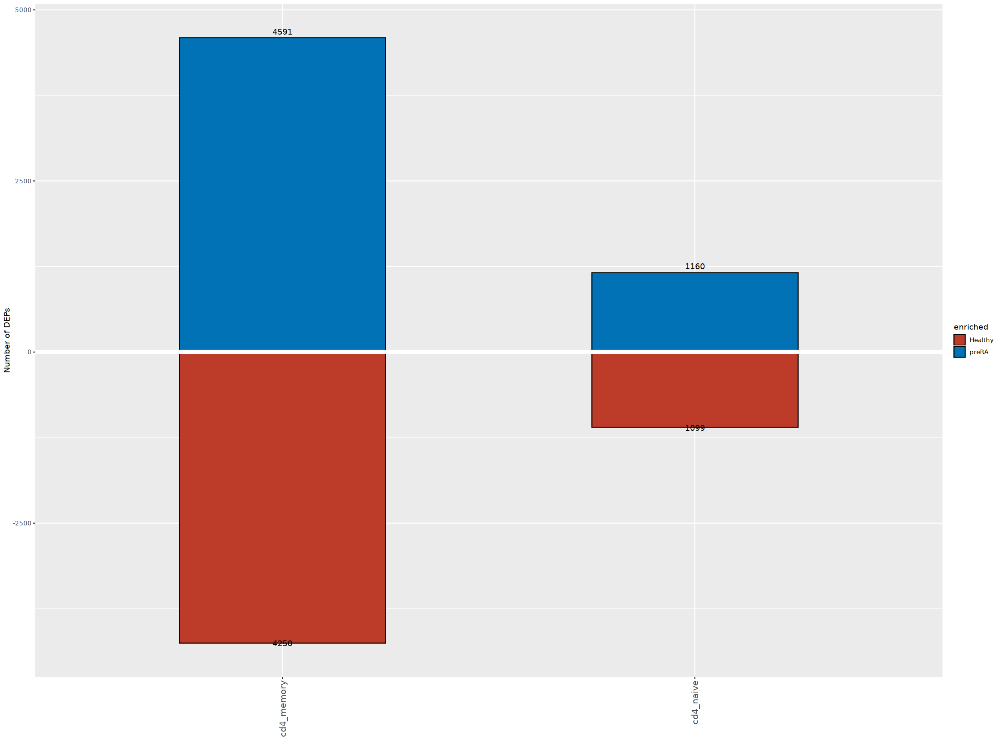

In [ ]:
# plot the deg counts
p1 <- ggplot(dep_counts, aes(width = 0.5, fill = enriched, y = dep_counts, x = cell_type)) +
  geom_bar(stat = "identity", color = "black") +
  geom_hline(yintercept = 0, color = "white", size = 2) +
  # scale_y_continuous(breaks = seq(-2000, 1200, by = 200)) +
  geom_text(aes(y = dep_counts + 50 * sign(dep_counts), label = abs(dep_counts)), vjust = 0, size = 4) +
  ylab("Number of DEPs") +
  xlab("") +
  theme(
    axis.text.x = element_text(angle = 90, hjust = 1, vjust = 0.5, size = 12),
    strip.text = element_text(size = 16)
  ) +
  scale_fill_manual(values = nejm_color)
# Adding line to differentiate -ve and +ve y axis
p1
ggsave(file.path(fig_path, paste0(proj_name, "_l2_celltype_MOCHA_deps_counts.pdf")),
  width = 8, height = 6
)


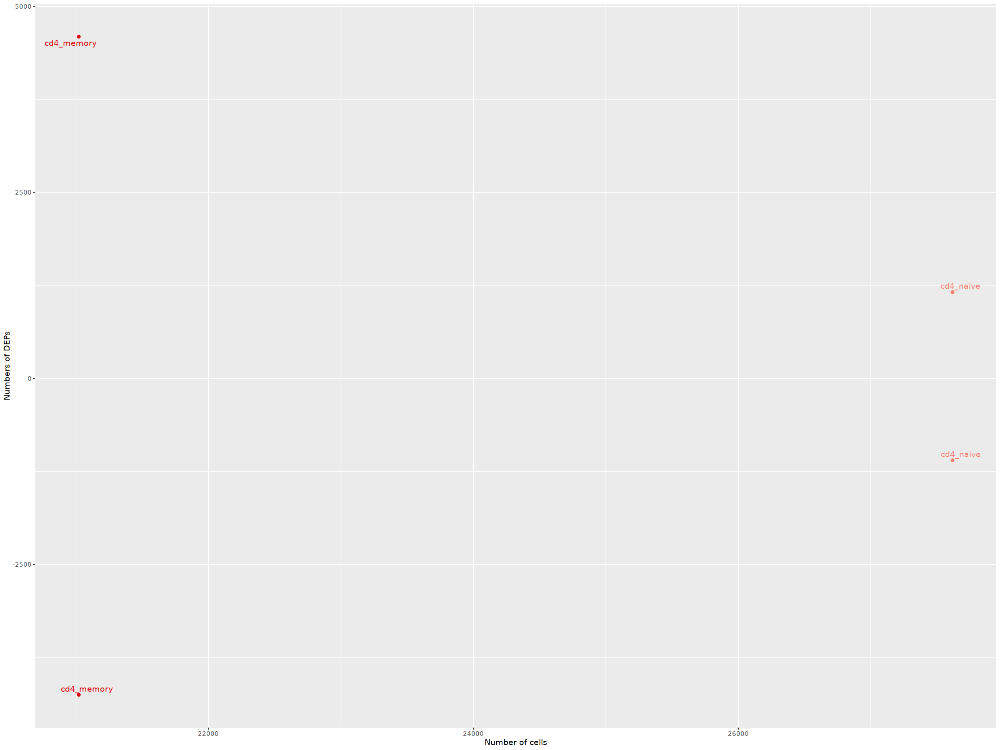

In [ ]:
p1 <- dep_counts %>%
    ggplot(aes(y = dep_counts, x = cell_counts, color = cell_type)) +
    geom_point() +
    ggrepel::geom_text_repel(aes(label = cell_type)) +
    scale_color_manual(values = cluster_colors) +
    xlab("Number of cells") +
    theme(legend.position = "none") +
    ylab("Numbers of DEPs")
p1


In [ ]:
dep_counts


cell_type,direction,dep_counts,enriched,cell_counts
<chr>,<chr>,<int>,<chr>,<int>
cd4_naive,down,-1099,Healthy,27617
cd4_naive,up,1160,preRA,27617
cd4_memory,down,-4250,Healthy,21021
cd4_memory,up,4591,preRA,21021


In [ ]:
# take cd4 naive as an example
# cell_type <- 'cd4_naive'
# filter the daps
deps_l2_fl <- deps_l2 %>% filter( # CellPopulation=='cd4_naive'&
    FDR < 0.2
)
# filter the degs
degs_l2_fl <- ra_tea_l2_pseudo_degs %>% filter( # cell_type=='cd4_naive'&
    FDR < 0.2
)
# some peaks will associated with the same genes
# for now just use one of them
deps_l2_unique <- deps_l2_fl %>%
    arrange(FDR) %>%
    distinct(gene, cell_type, .keep_all = TRUE)
table(deps_l2_fl$gene %in% degs_l2_fl$gene)



FALSE  TRUE 
 2033   524 

In [ ]:
table(deps_l2_fl$gene %in% degs_l2_fl$gene)
10447 + 653



FALSE  TRUE 
10447   653 

[1] 11100

In [ ]:
# combine the degs and deps
overlap_degs_deps <- degs_l2_fl %>%
    inner_join(deps_l2_unique, suffix = c(".degs", ".deps"), by = c("cell_type", "gene"))
overlap_degs_deps %>% head()


cell_type,gene,logFC,logCPM,F,PValue,FDR.degs,contrast,direction.degs,Tile,⋯,Test-Statistic,FDR.deps,Log2FC_C,MeanDiff,Avg_Intensity_Case,Pct0_Case,Avg_Intensity_Control,Pct0_Control,tileType,direction.deps
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<chr>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>
cd4_memory,CDK11A,-0.4357814,6.499314,5.498012,0.0369189797,0.19053573,cohortpre-RA,down,chr20:33993500-33993999,⋯,3.188776,0.17651415,-0.005679359,-0.06345575,4.074054,0,4.081055,0,Exonic,down
cd4_memory,SPEN,0.1280667,6.897478,6.441260,0.0212910508,0.14465889,cohortpre-RA,up,chr12:53054500-53054999,⋯,6.984694,0.09491447,-0.019687290,-0.20947373,3.946816,0,3.969811,0,Exonic,down
cd4_memory,SRSF10,-0.1583345,7.705434,8.073707,0.0113217498,0.10270860,cohortpre-RA,down,chr1:85277000-85277499,⋯,3.719388,0.15328486,-0.022432667,-0.20085598,3.705799,0,3.728232,0,Exonic,down
cd4_memory,MKNK1,0.1745903,5.202724,6.001697,0.0254890685,0.15775985,cohortpre-RA,up,chr10:131900000-131900499,⋯,7.760204,0.09491447,0.029120064,0.27189328,3.807807,0,3.777952,0,Promoter,up
cd4_memory,FUBP1,-0.2557231,7.910810,18.778324,0.0004566923,0.02030566,cohortpre-RA,down,chr10:13301500-13301999,⋯,6.250000,0.10018900,0.051929042,0.46584440,3.732456,0,3.683001,0,Promoter,up
cd4_memory,ZNF326,-0.4053165,6.362349,17.120838,0.0006955157,0.02519700,cohortpre-RA,down,chr15:26082500-26082999,⋯,3.188776,0.17651415,-0.012728619,-0.12655893,3.795958,0,3.808480,0,Exonic,down


Warning message:
“Removed 1 rows containing missing values (geom_point).”
Warning message:
“Removed 1 rows containing missing values (geom_text_repel).”
Warning message:
“ggrepel: 203 unlabeled data points (too many overlaps). Consider increasing max.overlaps”
Warning message:
“ggrepel: 34 unlabeled data points (too many overlaps). Consider increasing max.overlaps”
Warning message:
“Removed 1 rows containing missing values (geom_point).”
Warning message:
“Removed 1 rows containing missing values (geom_text_repel).”
Warning message:
“ggrepel: 182 unlabeled data points (too many overlaps). Consider increasing max.overlaps”
Warning message:
“ggrepel: 16 unlabeled data points (too many overlaps). Consider increasing max.overlaps”


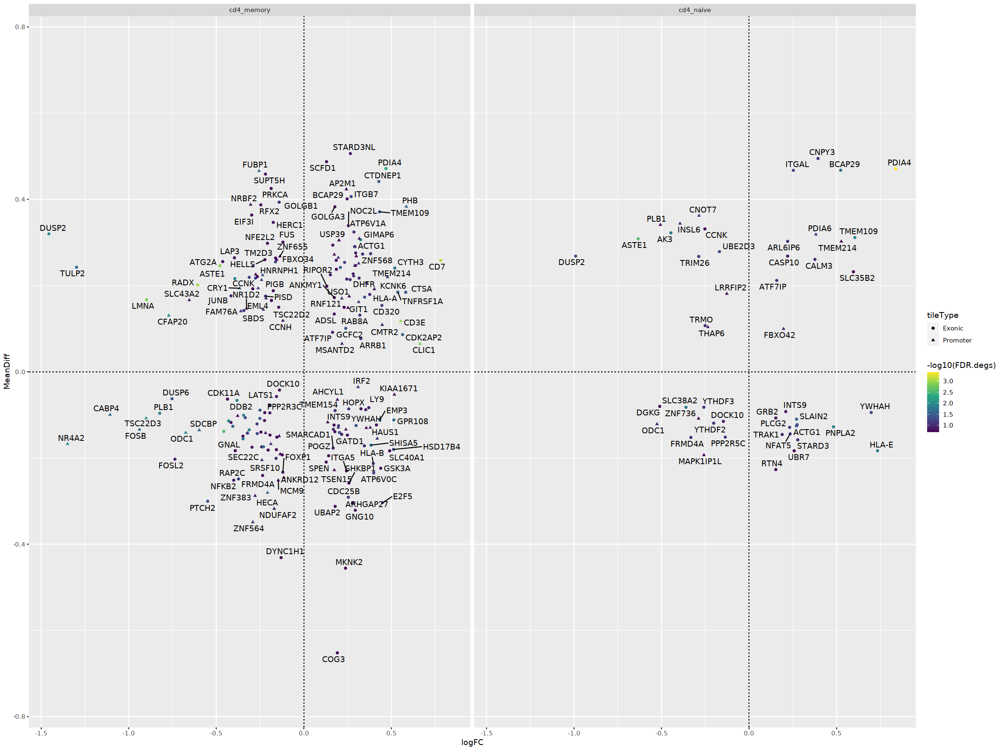

In [ ]:
p1 <- overlap_degs_deps %>% ggplot(aes(x = logFC, y = MeanDiff)) +
    geom_point(aes(color = -log10(FDR.degs), shape = tileType)) +
    ggrepel::geom_text_repel(aes(label = gene)) +
    geom_hline(yintercept = 0, linetype = "dashed") +
    geom_vline(xintercept = 0, linetype = "dashed") +
    facet_wrap(vars(cell_type)) +
    scale_color_viridis_c() +
    ylim(-0.75, 0.75)
p1
ggsave(file.path(fig_path, paste0(proj_name, "daps_degs_overlaping.pdf")), width = 12, height = 6)


# pseudobulk ananlysis for adt


In [ ]:
ra_tea_adt


class: SingleCellExperiment 
dim: 157 96595 
metadata(0):
assays(3): counts logcounts scaledata
rownames(157): CD86 CD274 ... CD80 TCR-Va24.Ja18
rowData names(0):
colnames(96595): bd196bb4867611ec8396aea599a86ab5
  bd19abb0867611ec8396aea599a86ab5 ... 6992a21e867911ecb648ee55e4236e76
  69963c12867911ecb648ee55e4236e76
colData names(70): orig.ident nCount_RNA ... clean_l2_cell_types ident
reducedDimNames(7): PCA UMAP ... ATAC_UMAP WNN.3.UMAP
mainExpName: cleanadt
altExpNames(0):

In [ ]:
ra_tea_all@meta.data %>%
    group_by(clean_l2_cell_types) %>%
    tally()


clean_l2_cell_types,n
<chr>,<int>
activated_switched_memory_b_cells,247
b_cells_c9,188
cd14mono_other,70
cd14mono_sub_a,859
cd14mono_sub_b,1804
cd16mono,637
cd4_ctl,347
cd4_memory,21021
cd4_naive,27617


In [ ]:
ra_tea_cd4na <- subset(ra_tea_all, clean_l2_cell_types == "cd4_naive")


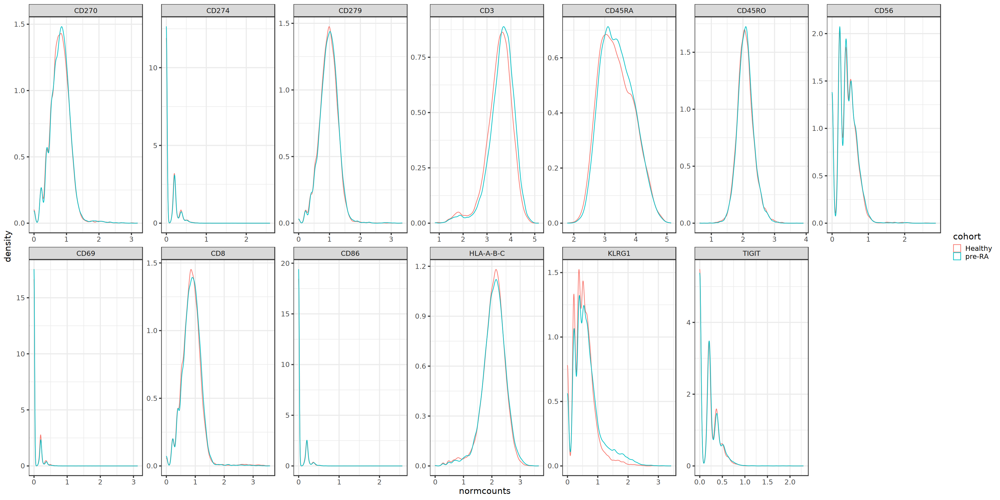

In [ ]:
# plot the
options(repr.plot.width = 30, repr.plot.height = 15)

marker.to.plot <- c(
    "CD86", "CD274", "CD270", "CD3", "CD8", "CD56", "CD69",
    "HLA-A-B-C", "CD45RA", "KLRG1", "CD45RO", "CD279", "TIGIT"
)
testdf <- cbind(ra_tea_cd4na@meta.data, t(as.matrix(GetAssayData(ra_tea_cd4na, slot = "data", assay = "cleanadt")))) %>%
    tidyr::gather(key = "marker", value = "normcounts", all_of(rownames(ra_tea_cd4na[["cleanadt"]]))) %>%
    filter(marker %in% marker.to.plot)
ggplot(testdf, aes(normcounts, color = cohort)) +
    geom_density() +
    theme_bw(base_size = 18) +
    facet_wrap(~marker, ncol = 7, scales = "free")


In [26]:
#' MakeSoPseudoBulk
#'
#' Create a wrapper function to prepare pseudoBulk for DEG analysis from seurat object using the functions from scran packages
#' agrregrate gene counts by cell type and subject
#'
#' @param so seurat object
#' @param meta.cols olumn names in so mata.data to keep in the SummarizedExperiment object, subject_id should be included. 
#' the pseudoBulk will be created by the unique combination in meta.cols
#' @param celltype.col column name in meta.cols to specifify the cell type or cluster
#' @param min_expr_var Character value or vector. Names of metadata columns in
#' \code{meta} for which to apply the minimum expression criteria
#' @param min_expr Numeric value between 0 and 1, default 0.1. Fraction of cells 
#' that must be expressed in at least one \code{min_expr_var} level for a gene 
#' to be kept
#' @param verbose logival value, default FALSE. If true will print a `message()` in the case of

#' @return pseudo a SummarizedExperiment object which nomarlized counts are aggregrate

#' @examples 
#' make pseudobulk for cd8 and cd8 naive by subject and cell type
#' cd4_cd8na_pseudo <- MakeSoPseudoBulk(
#'    cd4_cd8na, assay='RNA', meta.cols=c('pure_celltype', 'subject_id', 'pediatric_senior', 'CMV', 'batch_id'),
#'    celltype.col='pure_celltype',  min_expr_var='pure_celltype', min_expr=0.1, ncores=NULL, verbose = TRUE)

MakeSoPseudoBulk_adt <- function(so, assay='RNA', meta.cols, celltype.col, min_expr_var=NULL, min_expr=0.1, ncores=NULL, verbose = FALSE){
    require('scran')
    DefaultAssay(so) <- assay
    # setup parallelization parameters
    if(is.null(ncores)){
        ncores <- parallel::detectCores() - 3
    } else (ncores <- ncores)
    param <- BiocParallel::MulticoreParam(workers = ncores, progressbar = TRUE)
    if(verbose){
       message("Converting seurat object to sce object")  
    }
    # convert the seurat object to a sce object
    sce <- as.SingleCellExperiment(so, assay = assay)
    
    if(verbose){
       message("Computing normalize factor by computeSumFactors")  
    }
#     # normalized cell-specific biases
#     sce <- computeSumFactors(sce, clusters=colData(sce)[, celltype.col], BPPARAM=param)
    
#     #Compute log-normalized expression values
#     sce <- logNormCounts(sce)
    
    # # filter gene fy minimal expression per cell type
    # if(!is.null(min_expr_var)){
    #     # filter gene fy minimal expression per cell type
    #     selGenes <- FilterGenes(so, assay=assay, min_expr_var=min_expr_var, min_expr=min_expr)
    #     # filter genes of minimal expression requirement 
    #     sce <- sce[selGenes, ]
    # }
    # extract the metadta from the seurat object
    meta <-  DataFrame(so@meta.data[, meta.cols])
    # make pseudobulk summarized counts matrix across subject and cell type    
    if(verbose){
       message("Make pseudobulk summarized counts matrix across subject and cell type")  
    }
    pseudo_median <- aggregateAcrossCells(sce, meta, statistics="median",
                                          use.assay.type='logcounts', BPPARAM=param)
    return(pseudo_median)
}

In [ ]:
ra_tea_adt <- as.SingleCellExperiment(ra_tea_all, assay = "cleanadt")
ra_tea_adt
meta <- DataFrame(ra_tea_all@meta.data[, c("clean_l2_cell_types", "subject_id", "cohort", "Sex")])


class: SingleCellExperiment 
dim: 157 96595 
metadata(0):
assays(3): counts logcounts scaledata
rownames(157): CD86 CD274 ... CD80 TCR-Va24.Ja18
rowData names(0):
colnames(96595): bd196bb4867611ec8396aea599a86ab5
  bd19abb0867611ec8396aea599a86ab5 ... 6992a21e867911ecb648ee55e4236e76
  69963c12867911ecb648ee55e4236e76
colData names(70): orig.ident nCount_RNA ... clean_l2_cell_types ident
reducedDimNames(7): PCA UMAP ... ATAC_UMAP WNN.3.UMAP
mainExpName: cleanadt
altExpNames(0):

In [ ]:
param <- BiocParallel::MulticoreParam(workers = 50, progressbar = TRUE)
ra_adt_psudo <- scuttle::aggregateAcrossCells(ra_tea_adt, meta,
    statistics = "sum",
    use.assay.type = "counts", BPPARAM = param
)


  |======================================================================| 100%



In [ ]:
ra_adt_psudo


class: SingleCellExperiment 
dim: 157 440 
metadata(0):
assays(1): counts
rownames(157): CD86 CD274 ... CD80 TCR-Va24.Ja18
rowData names(0):
colnames: NULL
colData names(75): orig.ident nCount_RNA ... Sex ncells
reducedDimNames(7): PCA UMAP ... ATAC_UMAP WNN.3.UMAP
mainExpName: cleanadt
altExpNames(0):

In [ ]:
library(edgeR)

y <- DGEList(counts(ra_adt_psudo), samples = colData(ra_adt_psudo))


In [ ]:
keep %>% length()


[1] 157

In [ ]:
keep <- filterByExpr(y, group = ra_adt_psudo$cohort)
y <- y[keep, ]


In [ ]:
y <- calcNormFactors(y)
# y$samples


,group,lib.size,norm.factors,orig.ident,nCount_RNA,nFeature_RNA,barcodes,adt_qc_flag,adt_umis,batch_id,⋯,wsnn_res.0.8,l1_cell_types,l2_cell_types,clean_l2_cell_types,ident,clean_l2_cell_types.1,subject_id.1,cohort.1,Sex.1,ncells
,<fct>,<dbl>,<dbl>,<chr>,<dbl>,<int>,<chr>,<chr>,<int>,<chr>,⋯,<fct>,<chr>,<chr>,<chr>,<fct>,<chr>,<chr>,<chr>,<chr>,<int>
Sample1,1,3286,0.7801604,SeuratProject,4630,1964,a3715238867811ec9d4ce26673744a4e,Good,3289,EXP-00243,⋯,8,B cells,Activated Switched Memory B Cells,activated_switched_memory_b_cells,8,activated_switched_memory_b_cells,BR1019,Healthy,Female,1
Sample2,1,6696,0.9794694,SeuratProject,NA,NA,NA,Good,NA,EXP-00243,⋯,NA,B cells,Activated Switched Memory B Cells,activated_switched_memory_b_cells,NA,activated_switched_memory_b_cells,BR2018,Healthy,Female,2
Sample3,1,1789,1.3552625,SeuratProject,6757,2629,5a63cf0c867911ecb648ee55e4236e76,Good,1791,EXP-00243,⋯,8,B cells,Activated Switched Memory B Cells,activated_switched_memory_b_cells,8,activated_switched_memory_b_cells,BR2024,Healthy,Female,1
Sample4,1,4317,0.9232552,SeuratProject,3368,1600,69c4e5b4867711ecbf92d61b4111cf57,Good,4319,EXP-00243,⋯,8,B cells,Activated Switched Memory B Cells,activated_switched_memory_b_cells,8,activated_switched_memory_b_cells,BR2029,Healthy,Female,1
Sample5,1,87352,1.2008490,SeuratProject,NA,NA,NA,Good,NA,EXP-00243,⋯,NA,B cells,Activated Switched Memory B Cells,activated_switched_memory_b_cells,NA,activated_switched_memory_b_cells,BR2034,Healthy,Female,29
Sample6,1,8794,0.8597767,SeuratProject,NA,NA,NA,Good,NA,EXP-00243,⋯,NA,B cells,Activated Switched Memory B Cells,activated_switched_memory_b_cells,NA,activated_switched_memory_b_cells,CU1009,pre-RA,Female,3
Sample7,1,57815,1.2503828,SeuratProject,NA,NA,NA,Good,NA,EXP-00243,⋯,NA,B cells,Activated Switched Memory B Cells,activated_switched_memory_b_cells,NA,activated_switched_memory_b_cells,CU1013,pre-RA,Female,28
Sample8,1,7955,0.7995776,SeuratProject,NA,NA,NA,Good,NA,EXP-00243,⋯,23,B cells,Activated Switched Memory B Cells,activated_switched_memory_b_cells,23,activated_switched_memory_b_cells,CU1019,pre-RA,Female,2
Sample9,1,432945,1.0923470,SeuratProject,NA,NA,NA,Good,NA,EXP-00243,⋯,23,B cells,Activated Switched Memory B Cells,activated_switched_memory_b_cells,23,activated_switched_memory_b_cells,CU1022,pre-RA,Female,180


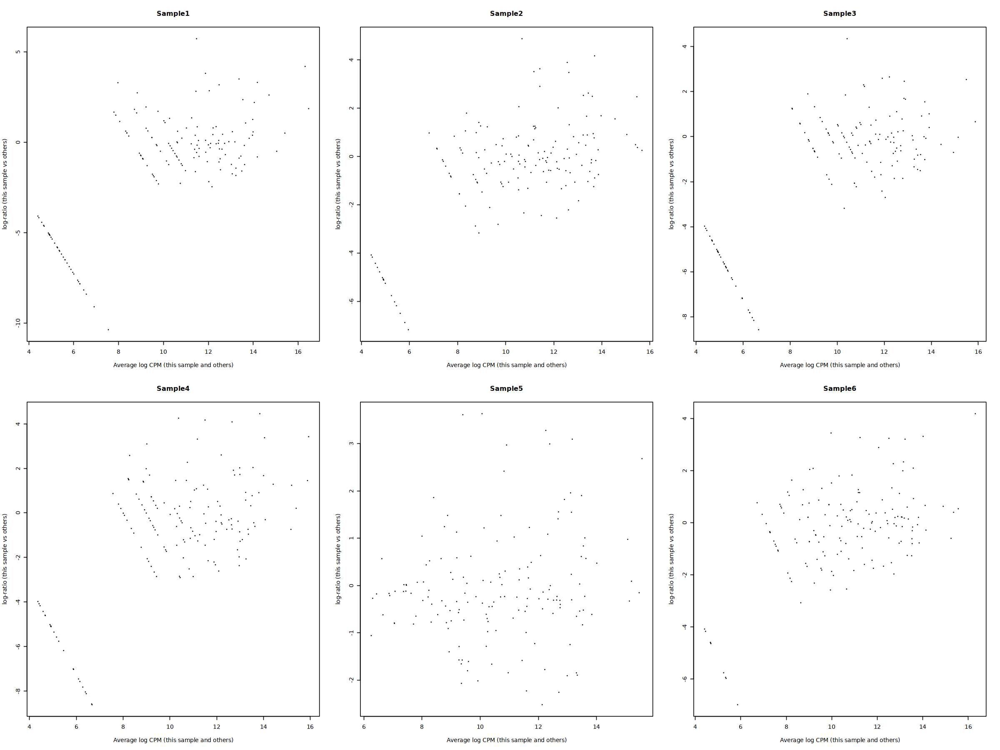

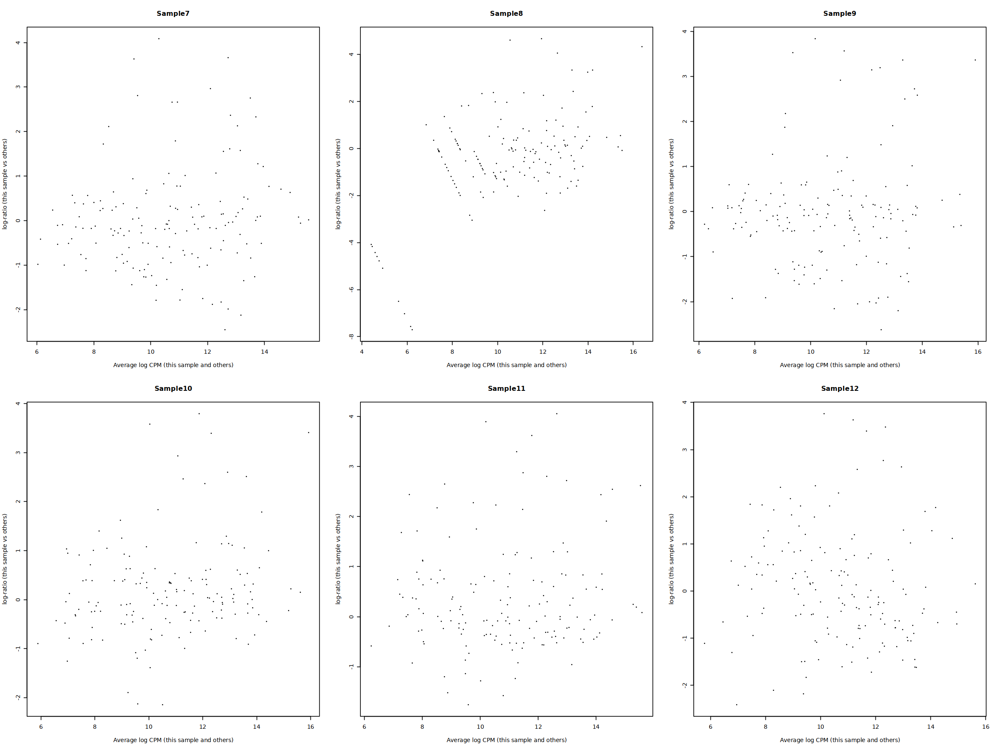

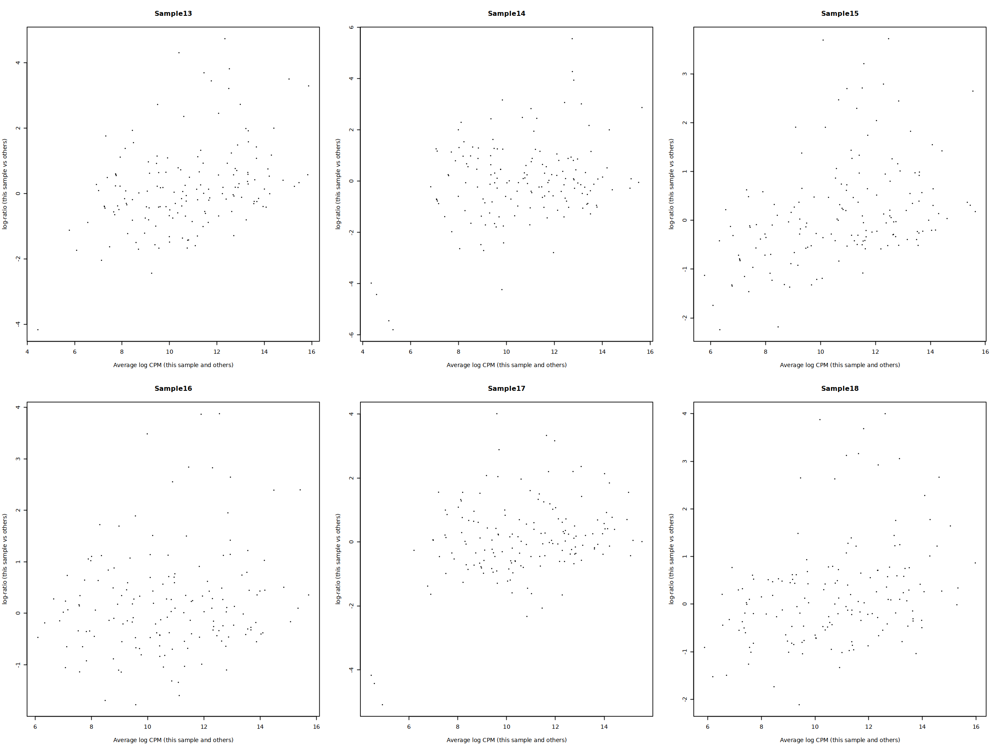

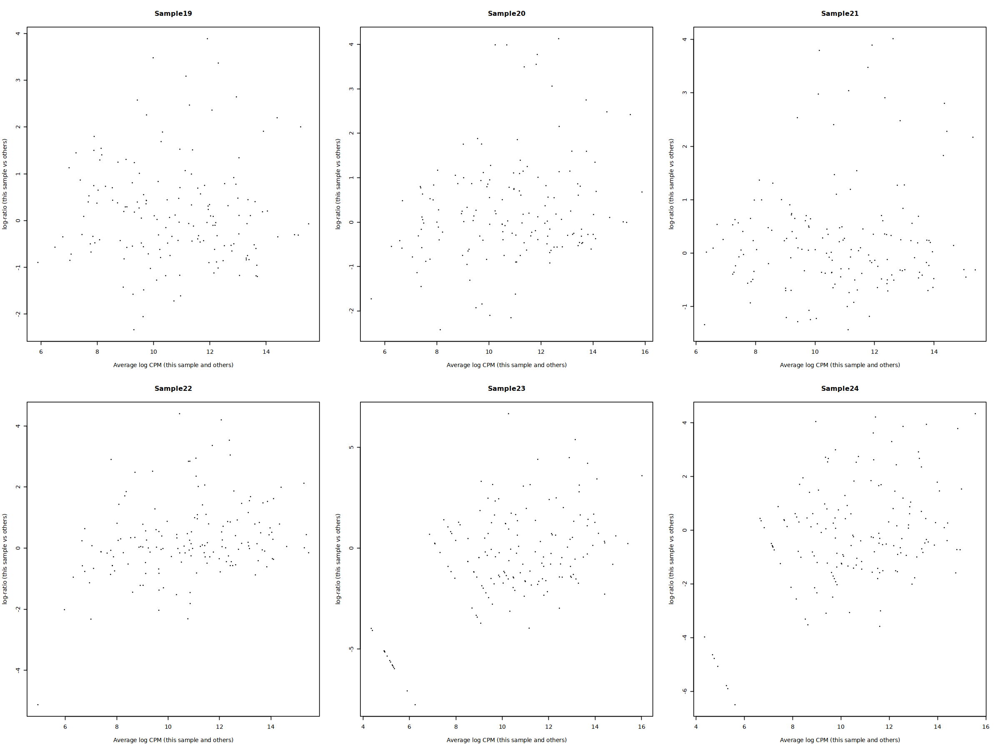

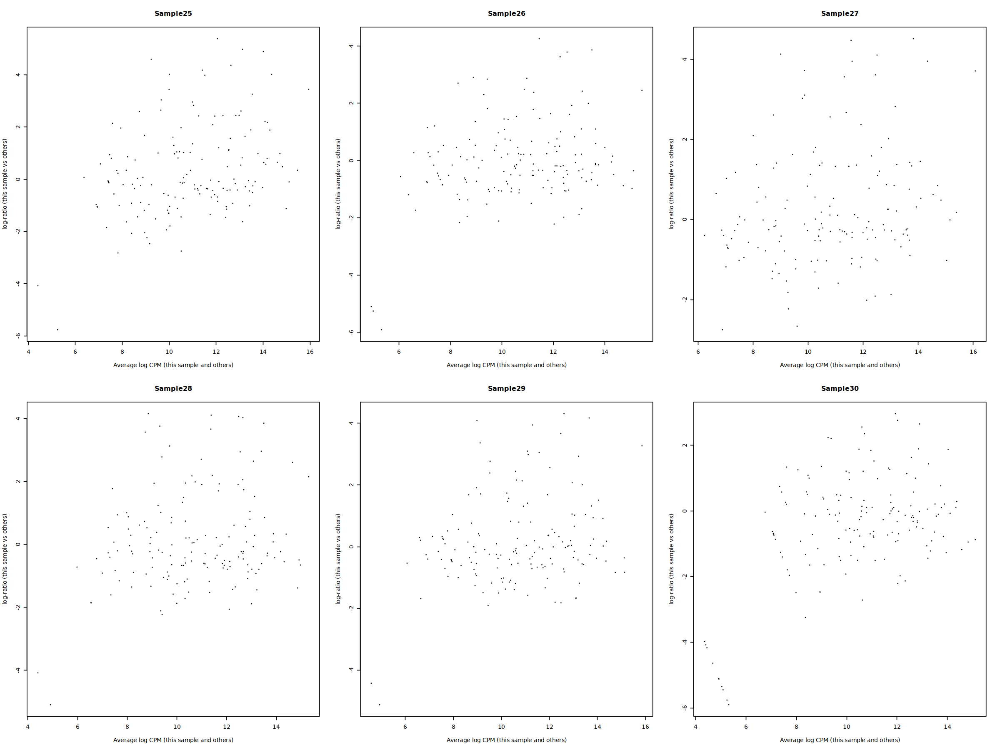

...

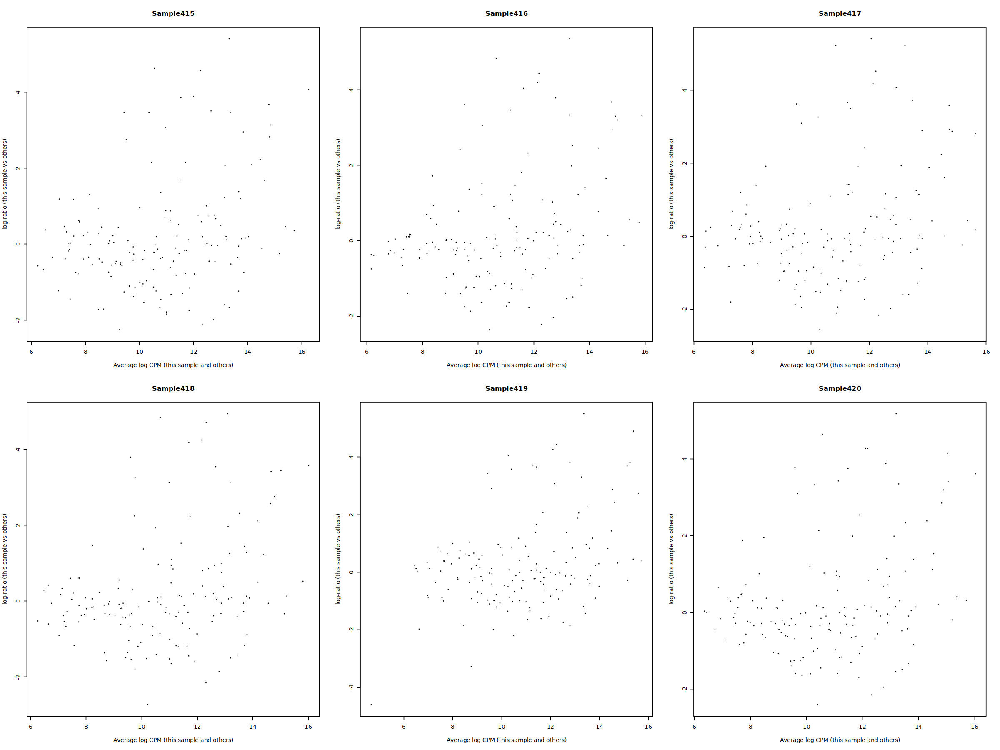

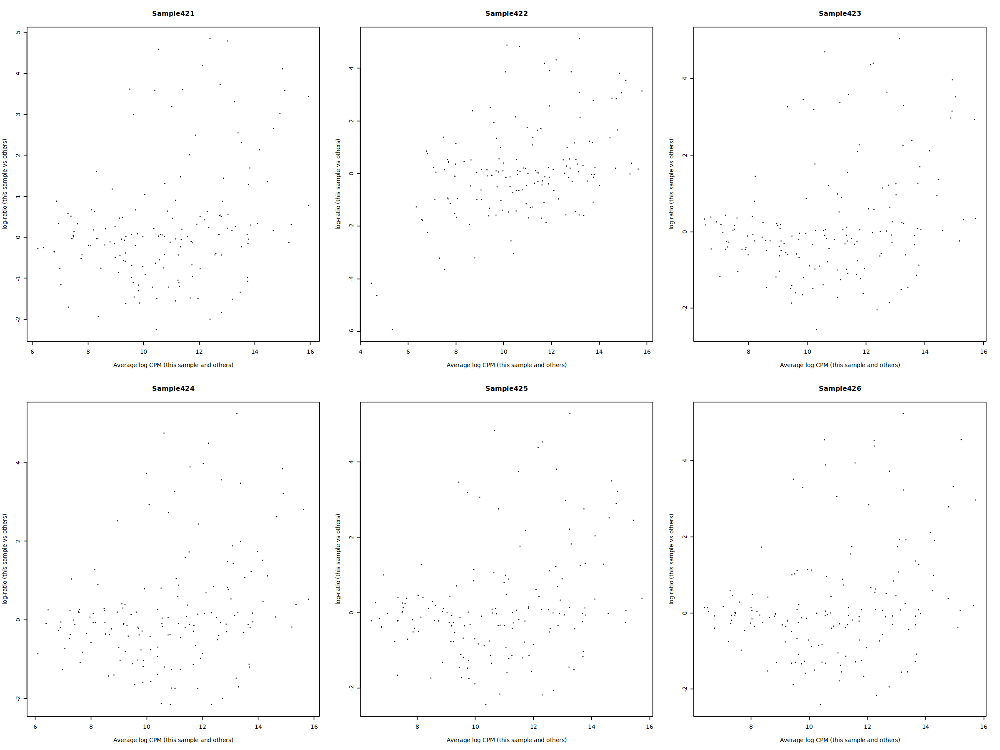

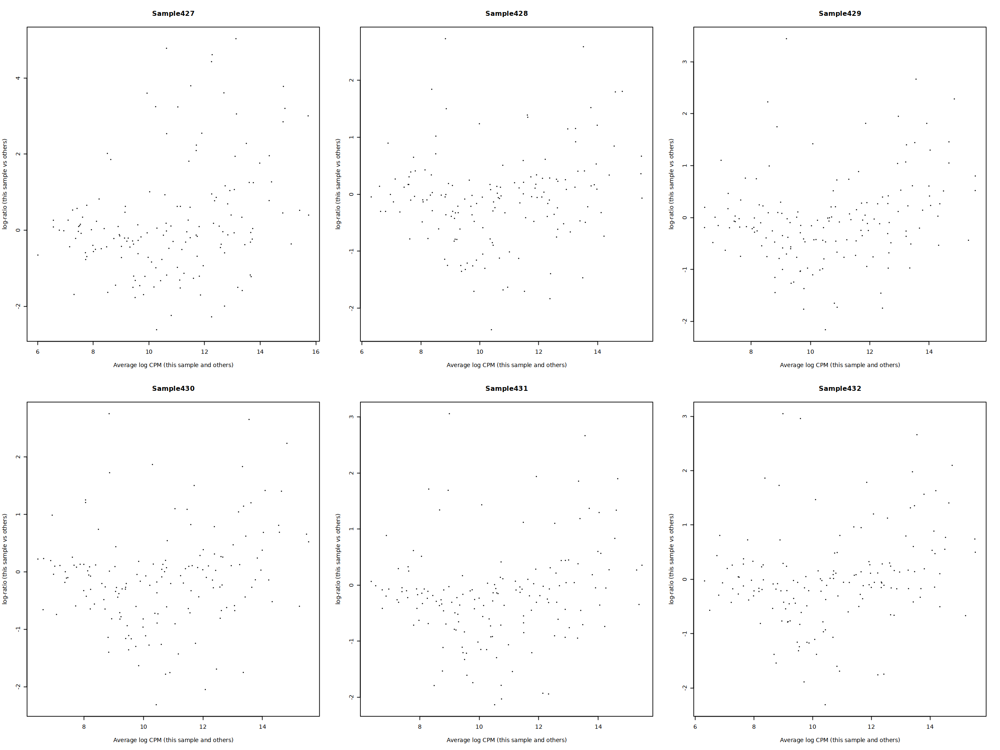

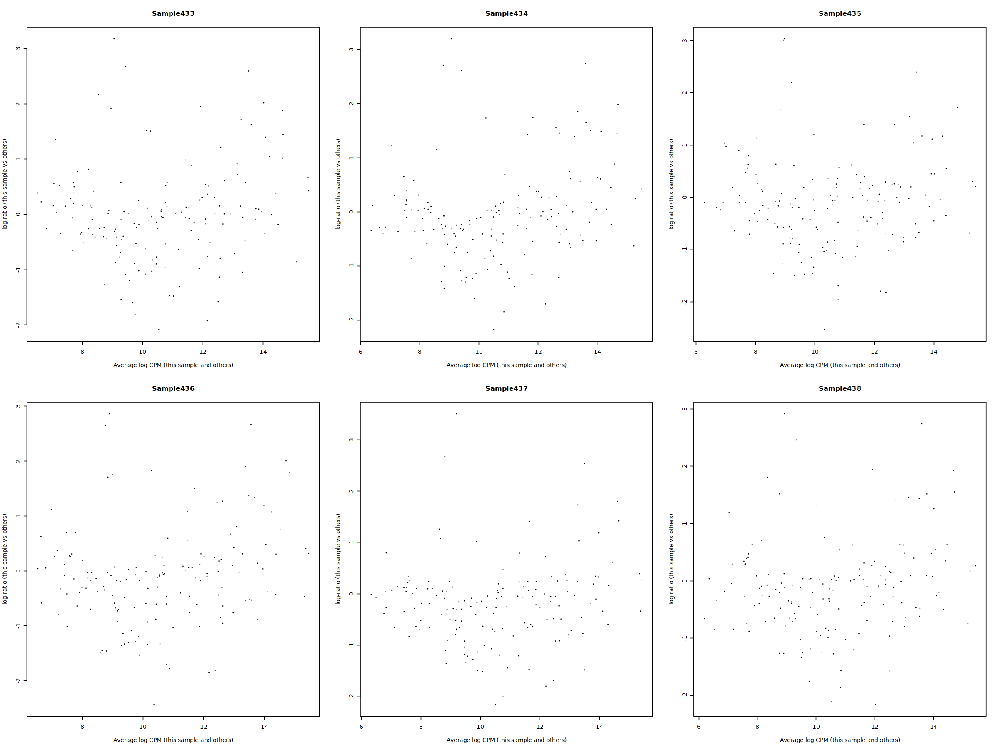

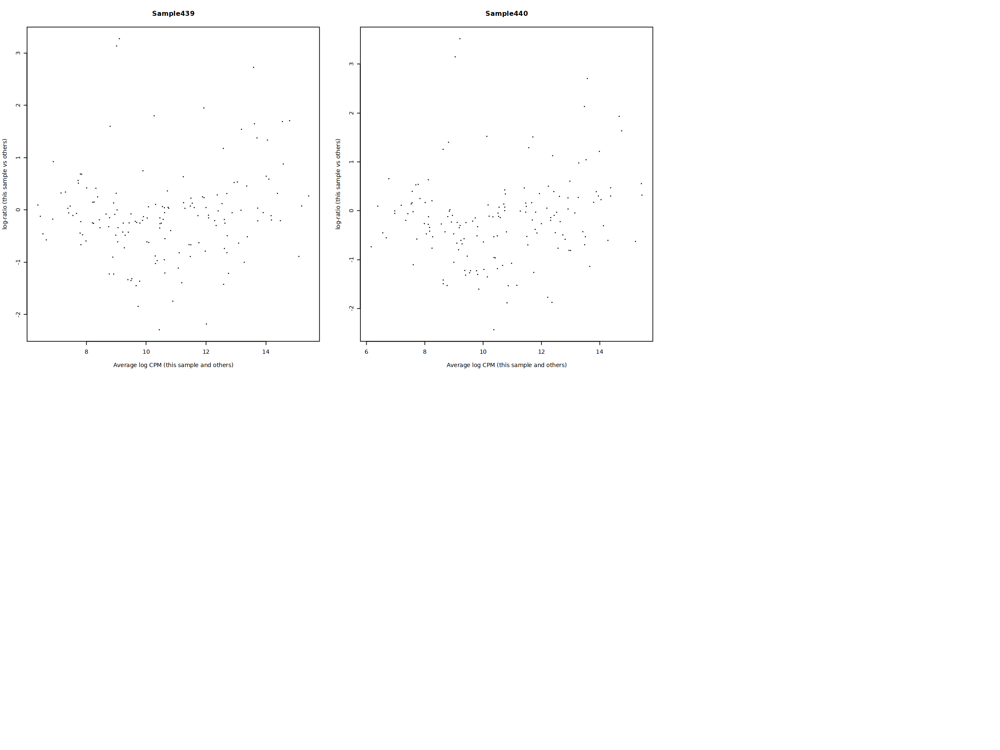

In [ ]:
par(mfrow = c(2, 3))
for (i in seq_len(ncol(y))) {
    plotMD(y, column = i)
}


In [ ]:
# run degs analysis by psedobulk pre-RA vs healthy and adjusted for age
ra_tea_l2_pseudo_deas <- scran::pseudoBulkDGE(ra_tea_l2_pseudo_adt,
   label = colData(ra_tea_l2_pseudo_adt)[, "clean_l2_cell_types"],
   design = as.formula("~ cohort + age"),
   coef = "cohortpre-RA"
) %>%
   lapply(FUN = as_tibble, rownames = "adt") %>%
   bind_rows(.id = "cell_type") %>%
   mutate(contrast = "cohortpre-RA")
